In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit


import os


In [2]:

data = pd.read_pickle('C:\PROJECT-DEMETER\VAE-Image\Down_Orbits-max-val-location.pkl')
min_samples = 100




<>:1: SyntaxWarning: invalid escape sequence '\P'
<>:1: SyntaxWarning: invalid escape sequence '\P'
C:\Users\mbabu\AppData\Local\Temp\ipykernel_56012\921158853.py:1: SyntaxWarning: invalid escape sequence '\P'
  data = pd.read_pickle('C:\PROJECT-DEMETER\VAE-Image\Down_Orbits-max-val-location.pkl')


in the Fn fit_and_plot_data, there are 2 time series.

t - the resampled data timepoints in terms of days  & t1 - the real data timepoints in terms of days

The residuals plotted here is the difference between real data and fitted curve(with t1).

Reduced-chisquare calculated on fitting of the resampled data


In [5]:


# Define the model function
def model_func(t, a, b, c, d, e):
    return a + t * b + c * np.sin((2 * np.pi * t) / d + e)

# Define the function to calculate filtered stats
def calculate_filtered_stats(data, column):
    mean_value = data[column].mean()
    conf_interval = stats.norm.interval(0.90, loc=mean_value, scale=np.std(data[column]))
    filtered_data = data[(data[column] >= conf_interval[0]) & (data[column] <= conf_interval[1])]
    
    if filtered_data.empty:
        filtered_data = data
    
    mean_filtered = filtered_data[column].mean()
    std_filtered = np.std(filtered_data[column]) / np.sqrt(len(filtered_data[column]))
    
    return mean_filtered, std_filtered

# Define the function to fit and plot data
def fit_and_plot_data(specific_key, min_samples, target, window_size, d, e):
    all_band_values = {}
    total_samples = sum(len(grid_data) for grid_data in data[specific_key])
    
    if total_samples <= min_samples:
        return  # Exit if total samples are insufficient

    for grid_data in data[specific_key]:
        for band_key, band_data in grid_data.items():
            if band_key == target: 
                if band_key in all_band_values:
                    all_band_values[band_key].append(band_data)
                else:
                    all_band_values[band_key] = [band_data]

    for band_key, band_values in all_band_values.items():
        # Extract datetime, Q3, and Max values and convert to DataFrame
        datetime_values = [pd.to_datetime(entry['datetime']) for entry in band_values]
        q3_values = [entry['Q3'] for entry in band_values]
        max_values = [entry['max'] for entry in band_values]

        df = pd.DataFrame({
            'datetime': datetime_values,
            'Q3': q3_values,
            'Max': max_values
        })

        df.set_index('datetime', inplace=True)
        timestamp_data1 = pd.to_datetime(datetime_values)
        timestamp_values1 = timestamp_data1.to_numpy().astype('datetime64[s]').astype('int')
        t1 = (timestamp_values1 - timestamp_values1[0]) / (24 * 3600)  # convert to days

        # Resample the DataFrame to specified window size
        resampled_groups = df.resample(window_size)
        window_data = {window: group for window, group in resampled_groups}

        results = []

        for key, dat in window_data.items():
            dat = dat.dropna(subset=['Q3', 'Max'])

            if not dat.empty and len(dat) >= 2:
                mean_std_results = {}
                for column in ['Q3', 'Max']:
                    mean_filtered, std_filtered = calculate_filtered_stats(dat, column)
                    mean_std_results[f'mean_{column}'] = mean_filtered
                    mean_std_results[f'std_{column}'] = std_filtered

                mean_std_results['window'] = key
                results.append(mean_std_results)
          
        if len(results) < 25:  # Adjust the threshold as needed
            print(f"Ignoring specific_key: {specific_key}, not enough data points after resampling")
            continue

        resampled_df = pd.DataFrame(results)
        resampled_df.dropna(inplace=True)

        # Convert datetime index to numeric for fitting
        t_data = resampled_df['window']
        timestamp_data = pd.to_datetime(t_data)
        timestamp_values = timestamp_data.to_numpy().astype('datetime64[s]').astype('int')
        t = (timestamp_values - timestamp_values[0]) / (24 * 3600)  # convert to days

        q_resampled = {}
        q_std = {}
        for column in ['Q3', 'Max']:
            q_resampled[column] = resampled_df[f'mean_{column}'].values
            q_std[column] = resampled_df[f'std_{column}'].values

        initial_guess = {}
        for column in ['Q3', 'Max']:
            initial_guess[column] = [
                np.mean(q_resampled[column]),
                (q_resampled[column][-1] - q_resampled[column][0]) / len(q_resampled[column]),
                (q_resampled[column].max() - q_resampled[column].min()) / 2,
                d,
                e
            ]

        lower_bounds = [-np.inf, -np.inf, 0, 365.25, -np.inf]
        upper_bounds = [np.inf, np.inf, 2.5, 365.2500001, np.inf]

        popt = {}
        pcov = {}
        residuals_dict = {}
        residual_errors_dict = {}

        fig, axes = plt.subplots(2, 2, figsize=(18, 10))  # 2x2 grid for plotting

        for idx, column in enumerate(['Q3', 'Max']):
            popt[column], pcov[column] = curve_fit(
                model_func,
                t,
                q_resampled[column],
                p0=initial_guess[column],
                sigma=q_std[column],
                maxfev=650000,
                bounds=(lower_bounds, upper_bounds)
            )

            a, b, c, d, e = popt[column]
            y_fit = model_func(t, a, b, c, d, e)
            y_fit1 = model_func(t1, a, b, c, d, e)
            t_fine = np.linspace(t.min(), t.max(), len(datetime_values))
            y_fit_fine = model_func(t_fine, a, b, c, d, e)

            chi_square = np.sum(((q_resampled[column] - y_fit) / q_std[column]) ** 2)
            dof = len(q_resampled[column]) - len(popt[column])
            rcs_resampled = chi_square / dof

            fine_timestamps = pd.to_datetime(t_fine * 24 * 3600 + timestamp_values[0], unit='s')
            
            # Plot data with error bars and fitted curve on the left (axes[0, idx])
            axes[0, idx].errorbar(t_data, q_resampled[column], yerr=q_std[column], fmt='o', ecolor='r', label=f'{column} Resampled')
            axes[0, idx].plot(fine_timestamps, y_fit_fine, label=f'{column} Fitted Curve')
            axes[0, idx].text(0.9, 0.05, f' rcs - {rcs_resampled:.2f}', horizontalalignment='center',
                              verticalalignment='center', transform=axes[0, idx].transAxes,
                              fontsize=9, color='green')

            axes[0, idx].set_ylabel(column)
            axes[0, idx].legend()
            axes[0, idx].set_title(f'{specific_key} - {band_key} - {window_size}       unit : log(μV^2 m^-2 Hz^-1)')

            # Plot residuals on the right (axes[1, idx])
            residuals = q3_values if column == 'Q3' else max_values - y_fit1
            residuals_dict[column] = residuals
            residual_errors_dict[column] = np.std(residuals)

            axes[1, idx].scatter(datetime_values, residuals, s=3)
            axes[1, idx].axhline(y=0, color='gray', linestyle='--')
            axes[1, idx].set_xlabel('Time')
            axes[1, idx].set_ylabel(f'{column} Residual')

        plt.tight_layout()  # Adjust layout to fit everything
        plt.show()


G123
fb_1


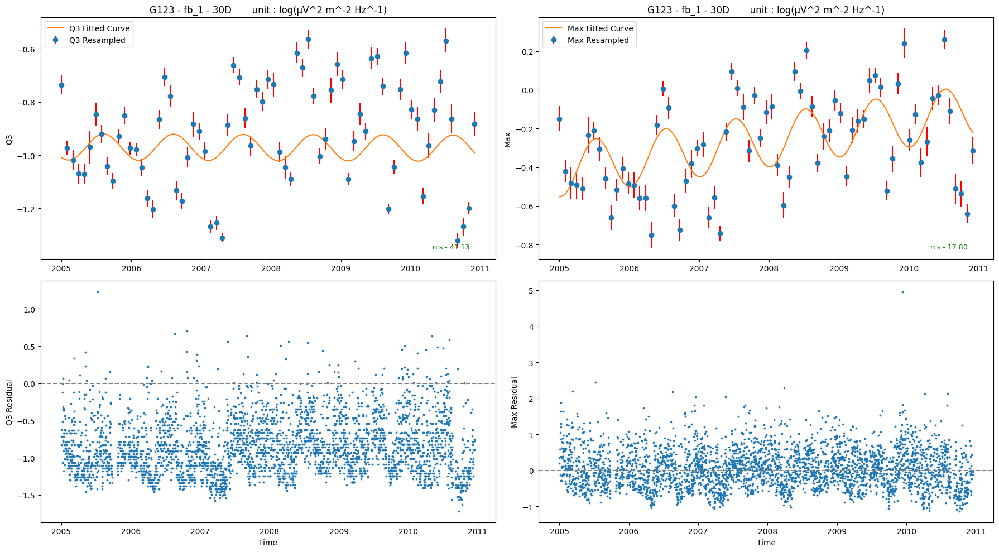

fb_4


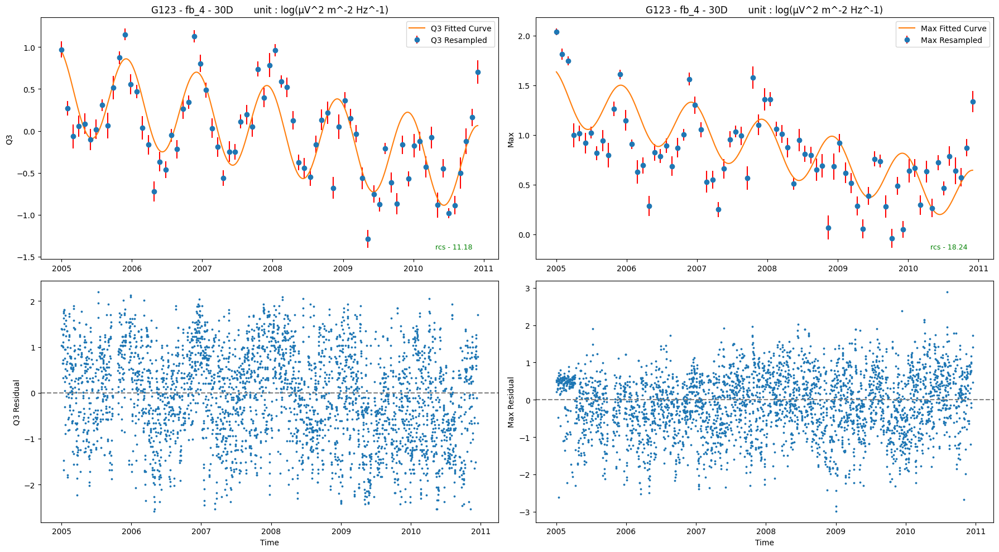

fb_11


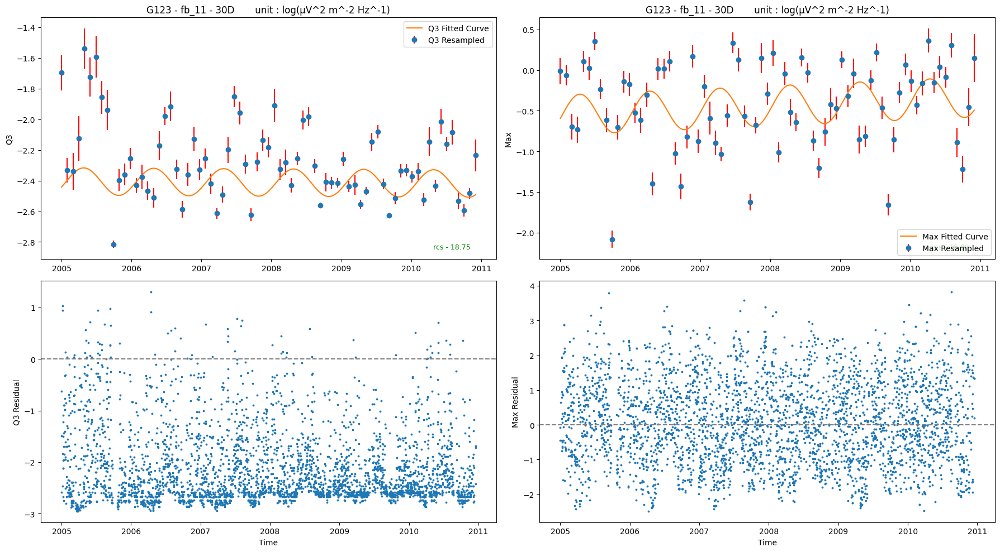

G124
fb_1


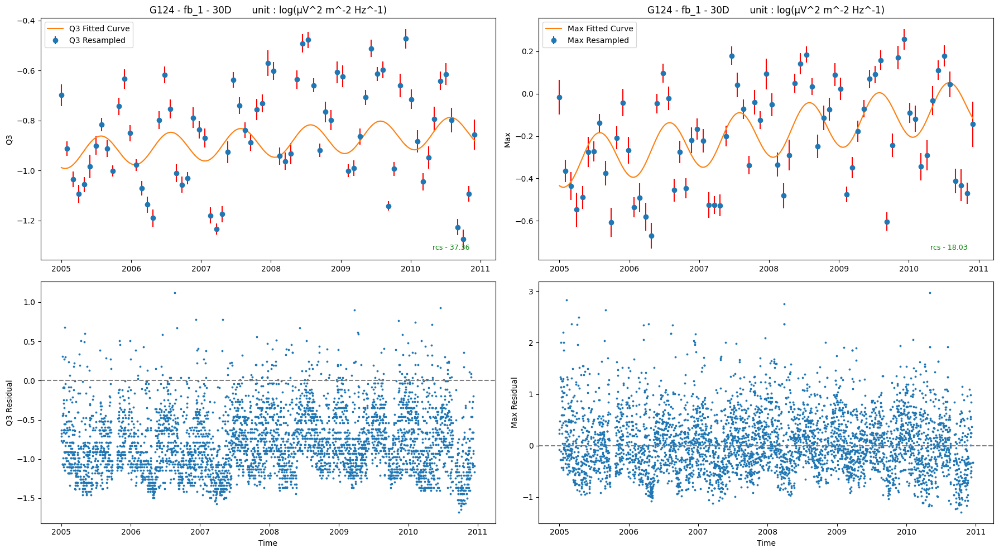

fb_4


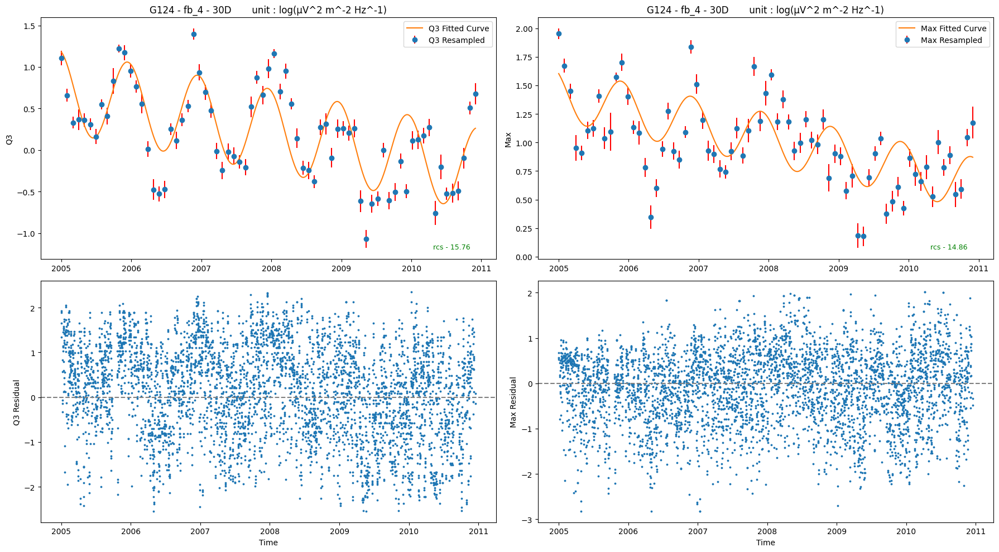

fb_11


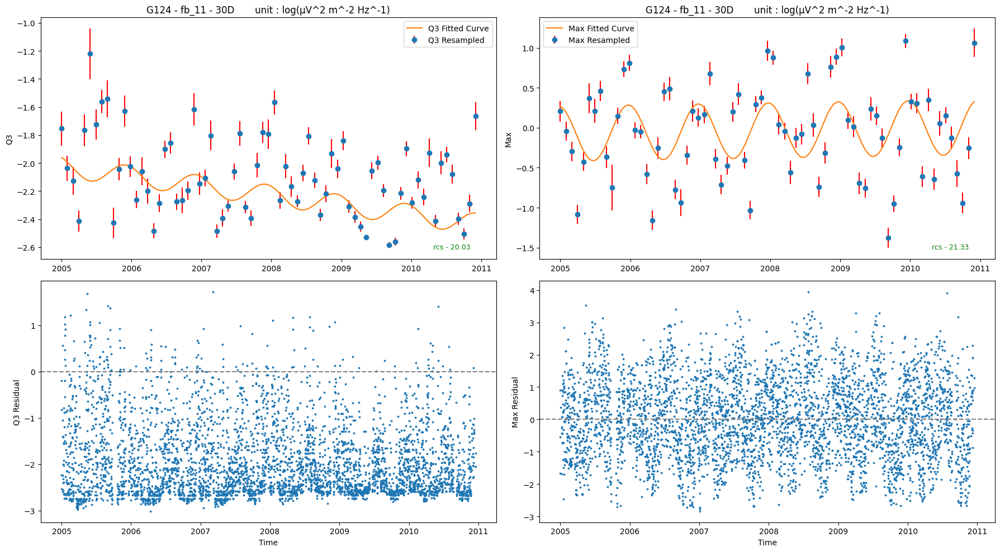

G125
fb_1


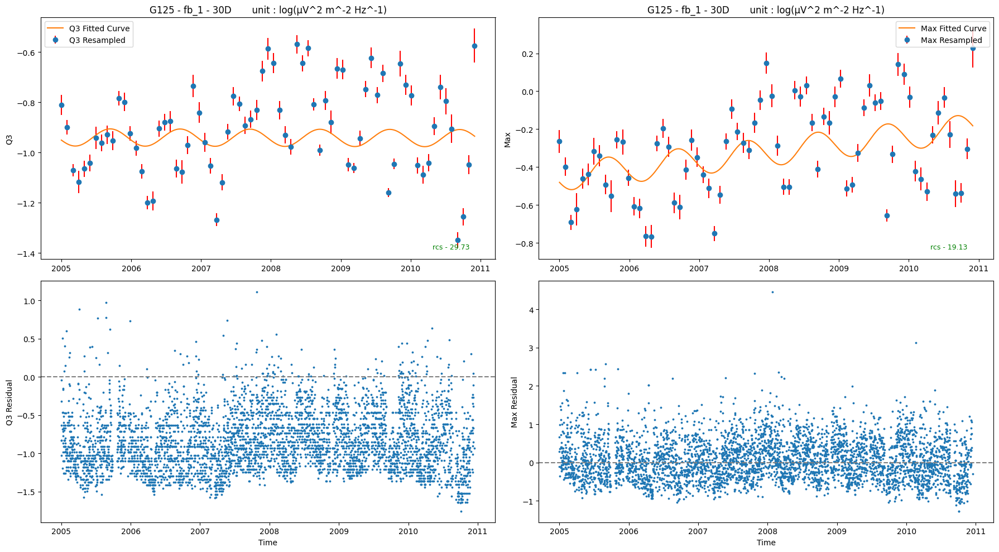

fb_4


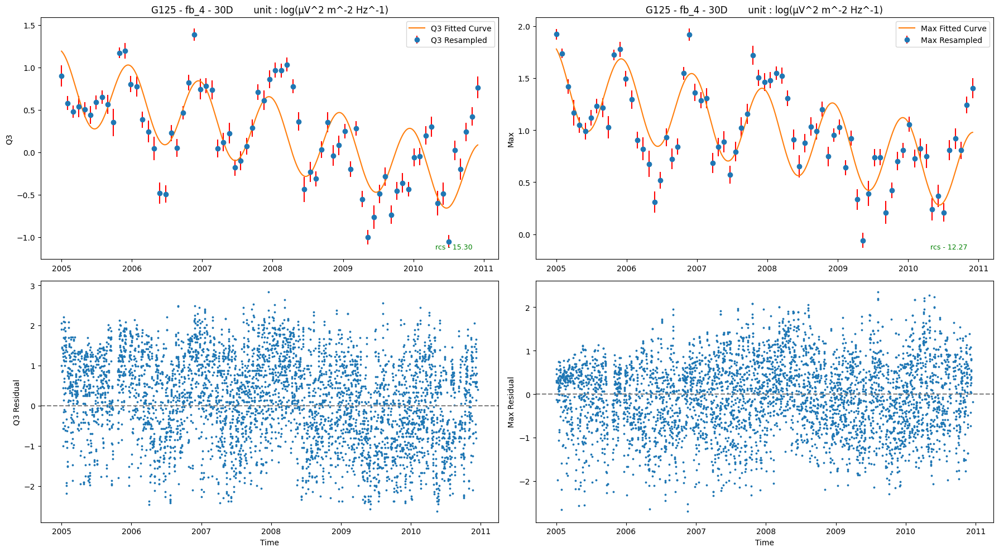

fb_11


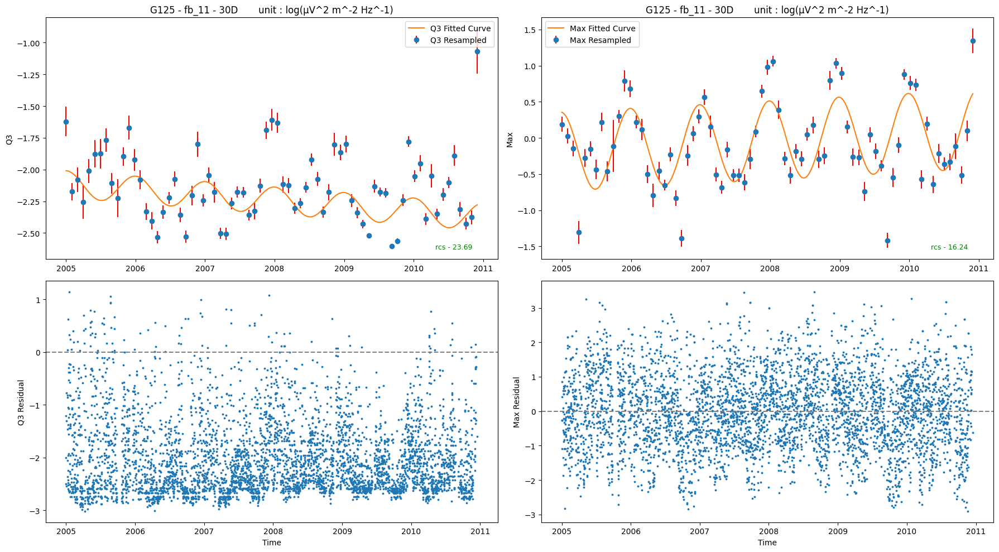

G105
fb_1


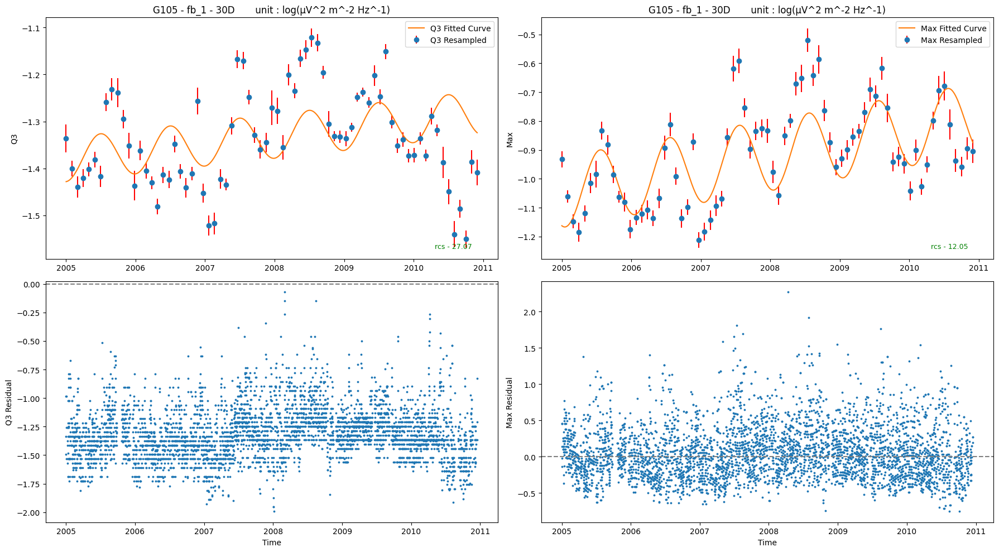

fb_4


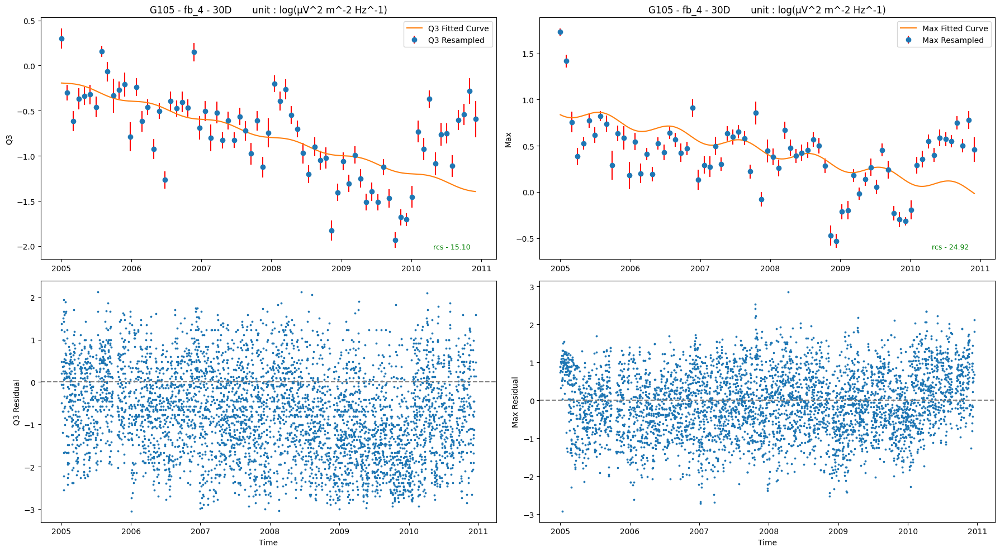

fb_11


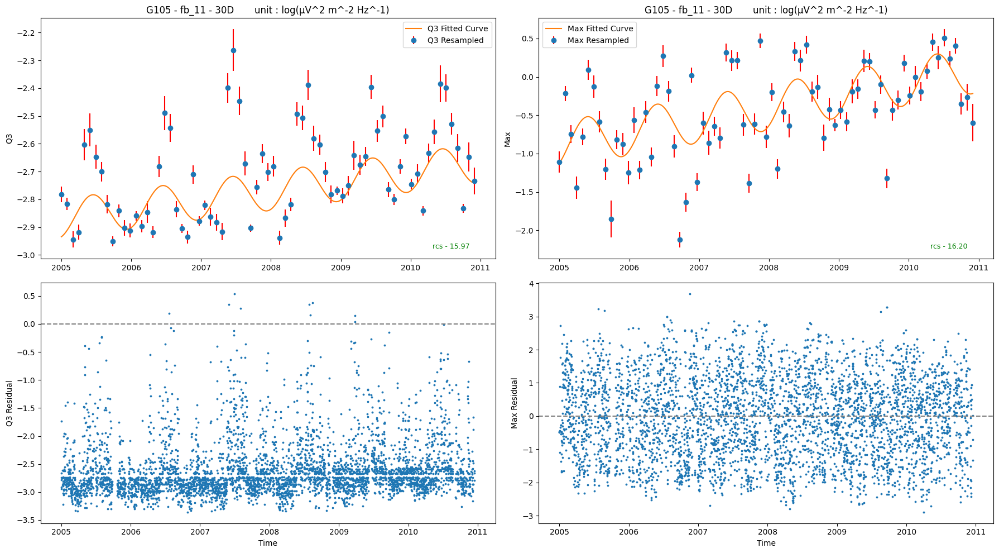

G106
fb_1


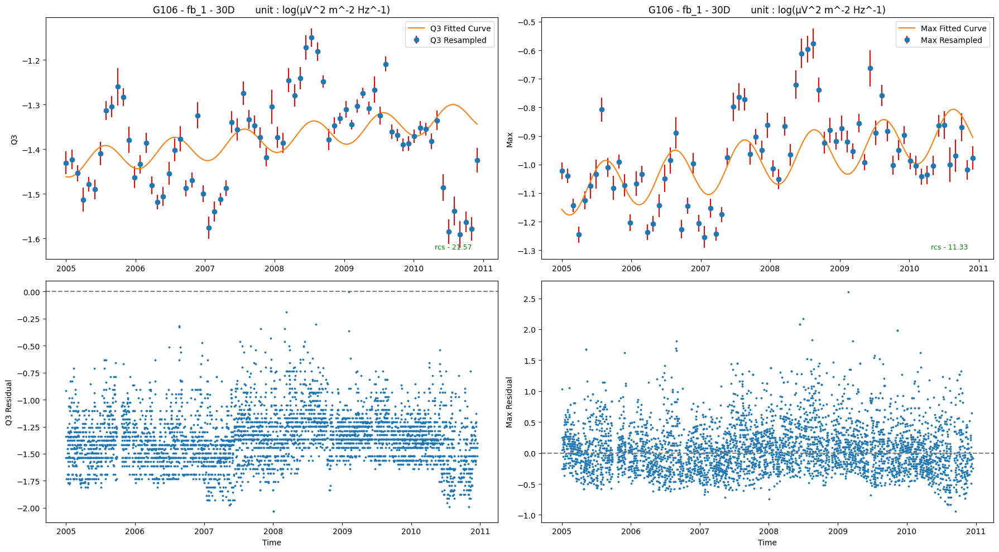

fb_4


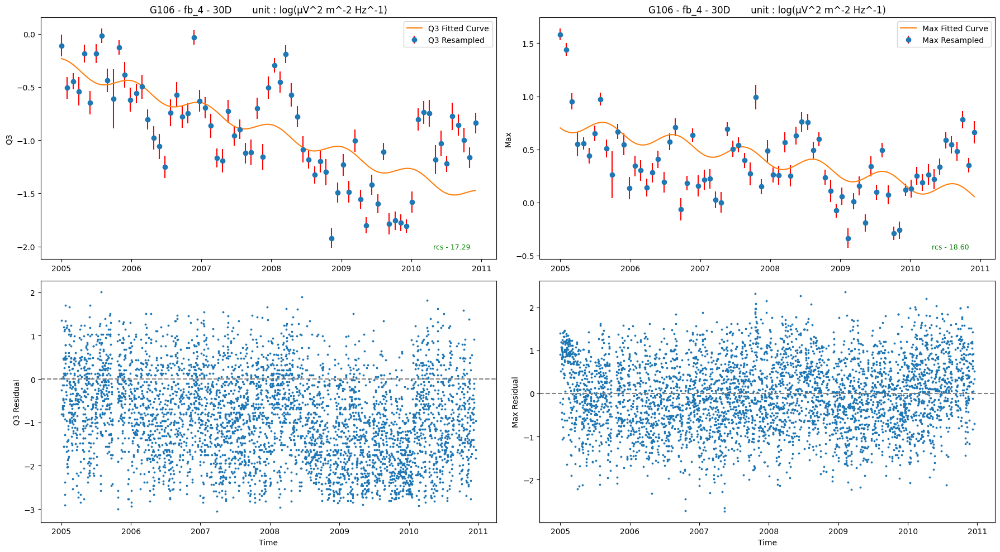

fb_11


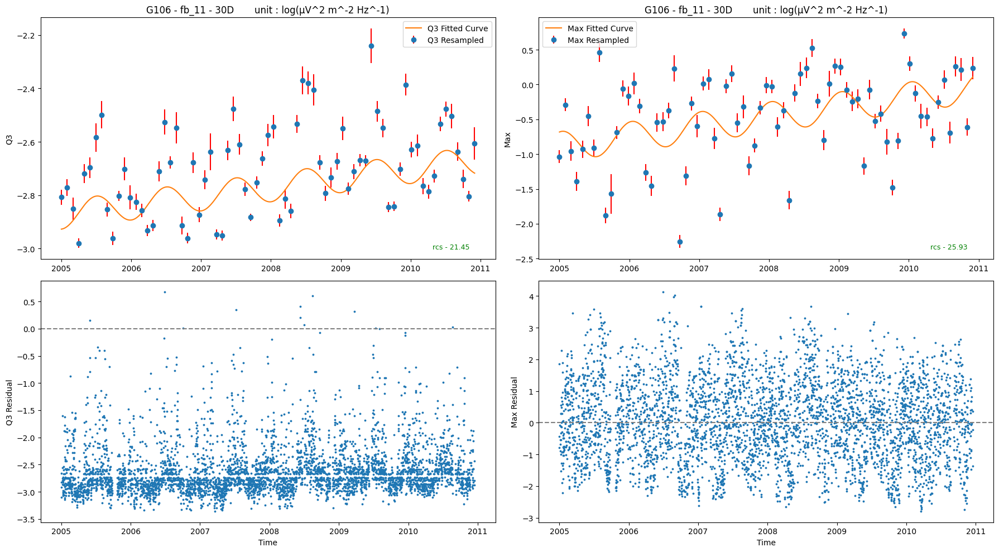

G107
fb_1


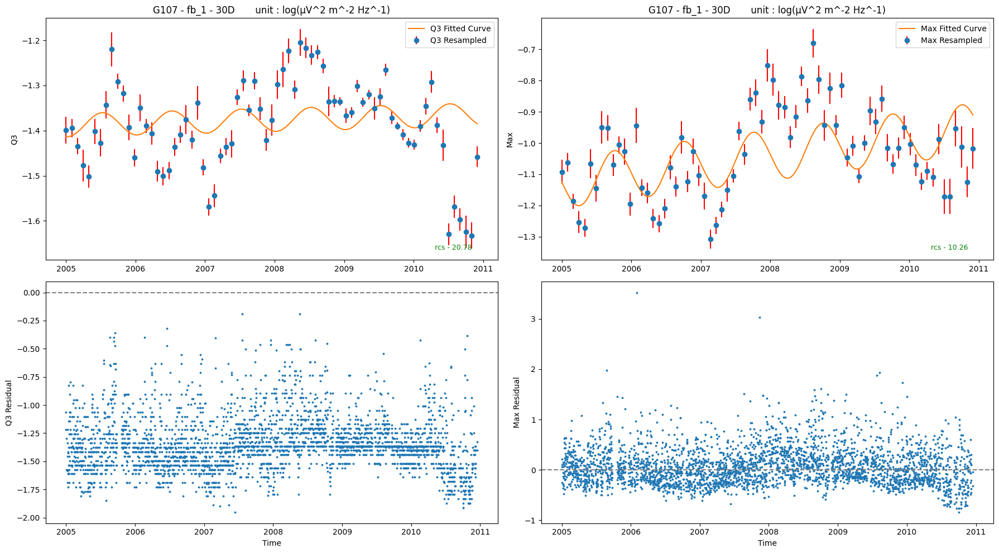

fb_4


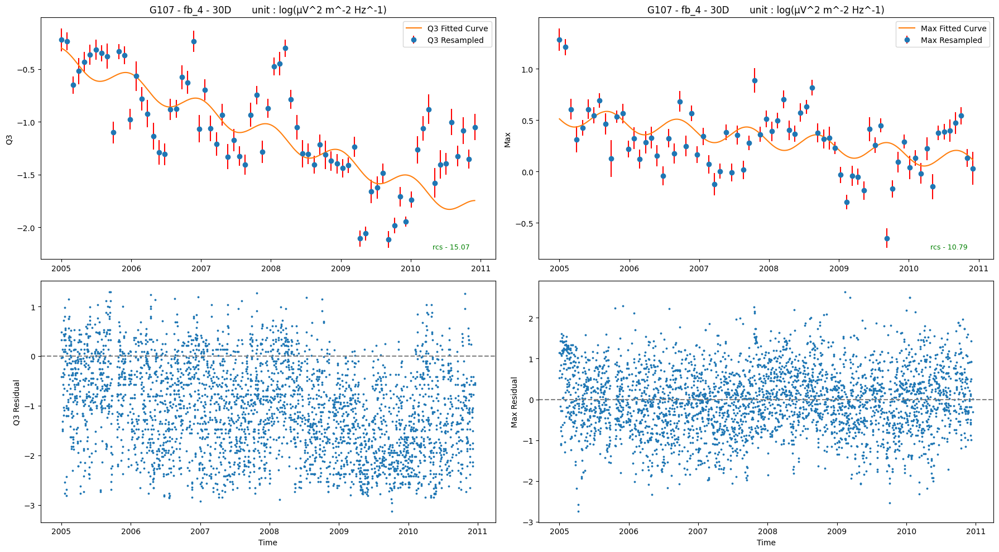

fb_11


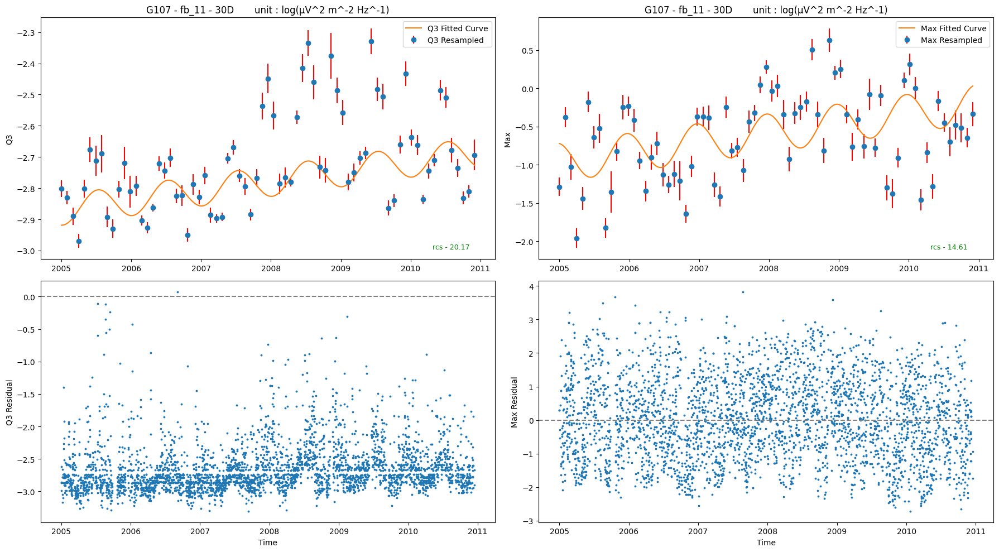

G87
fb_1


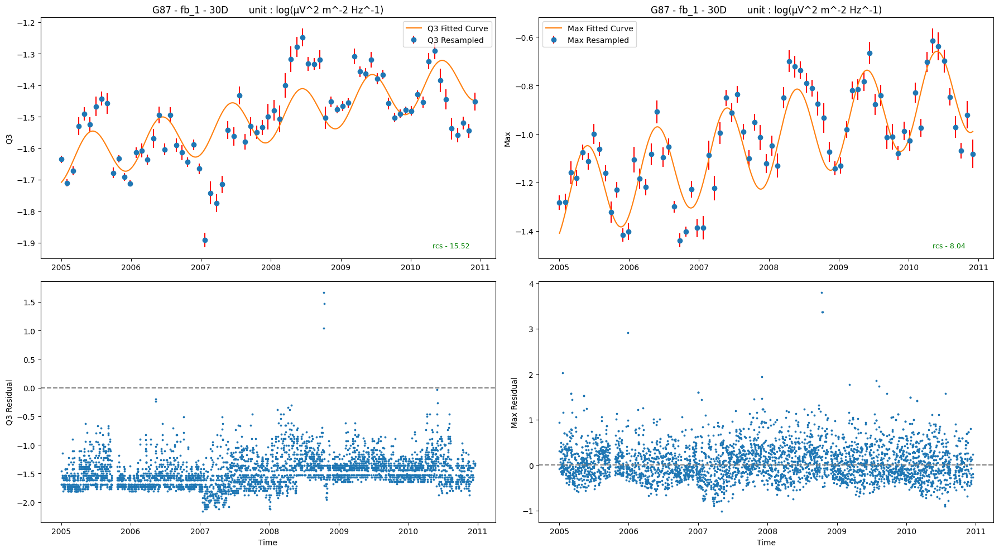

fb_4


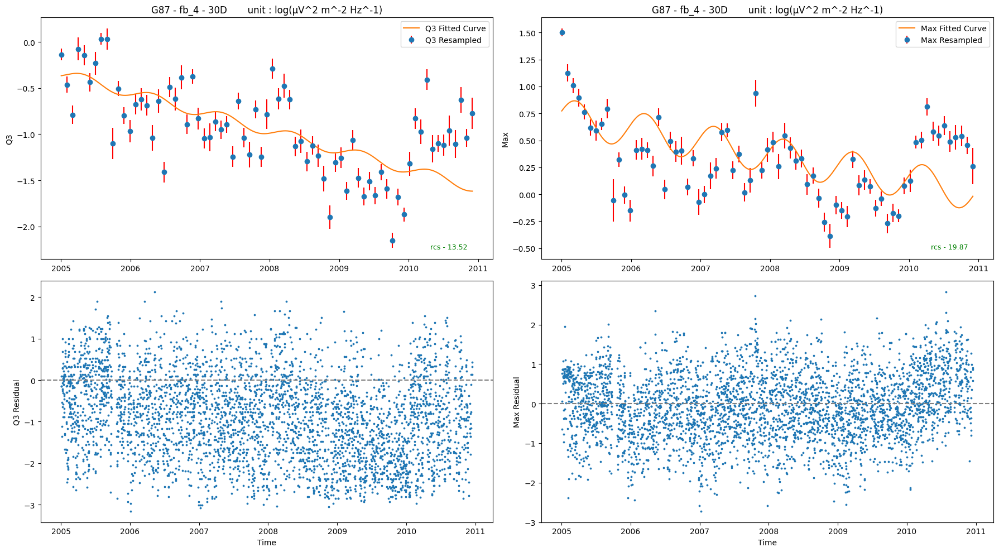

fb_11


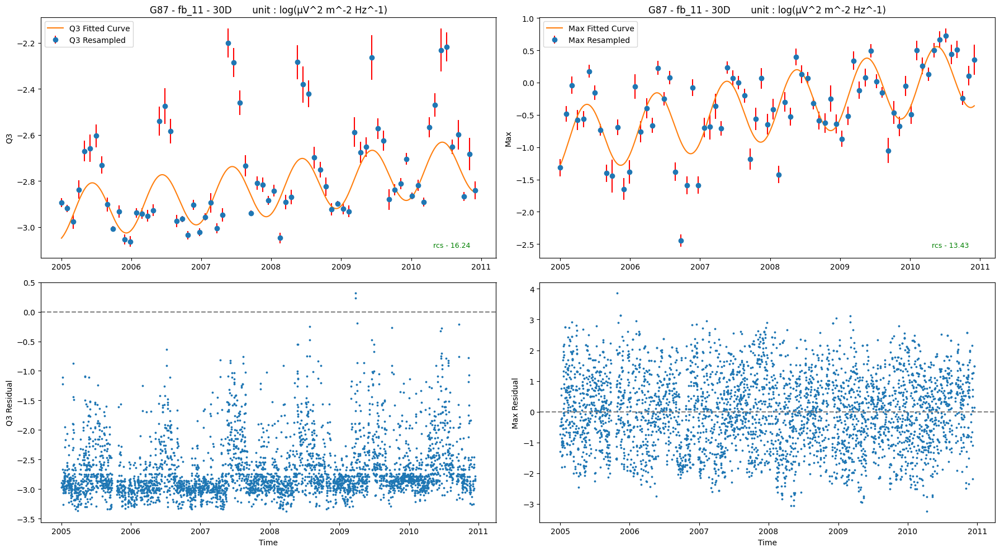

G88
fb_1


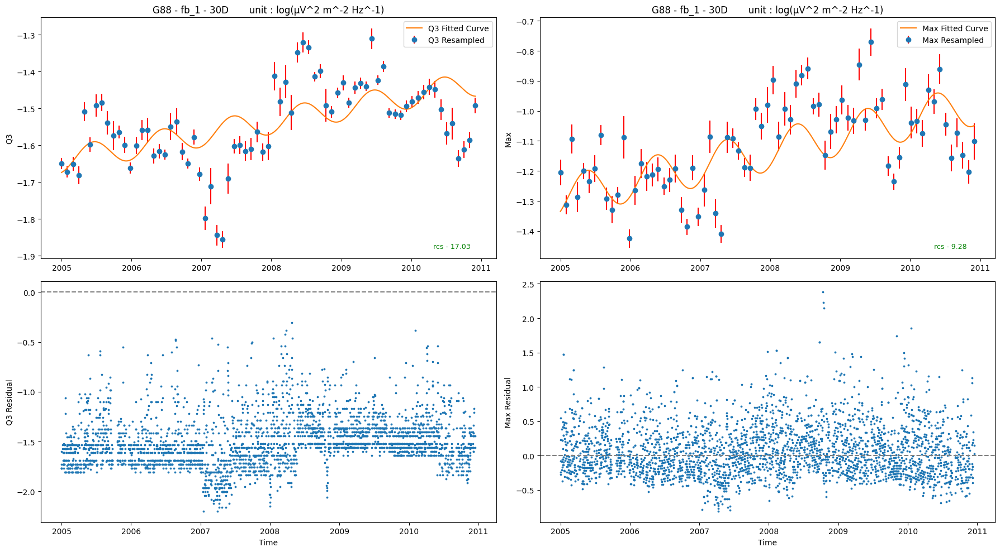

fb_4


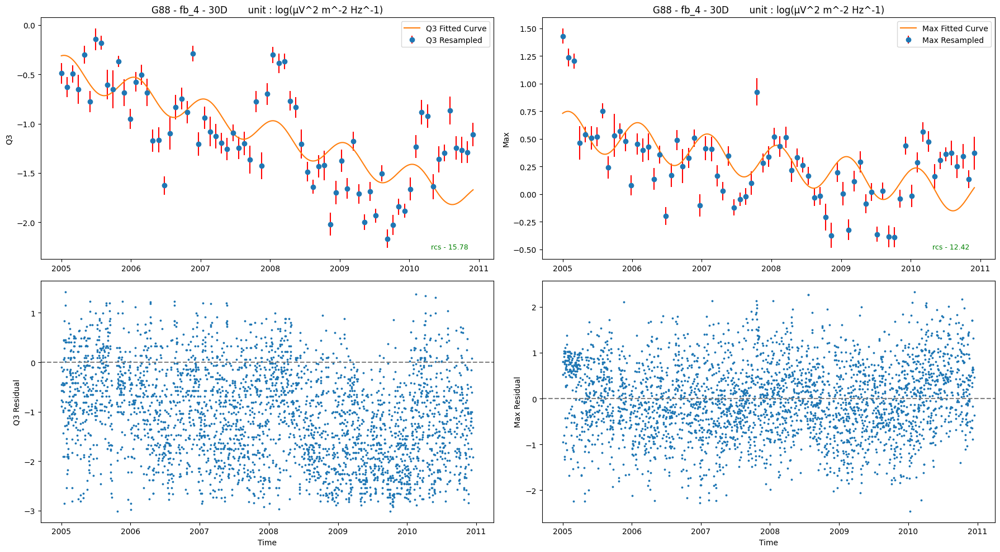

fb_11


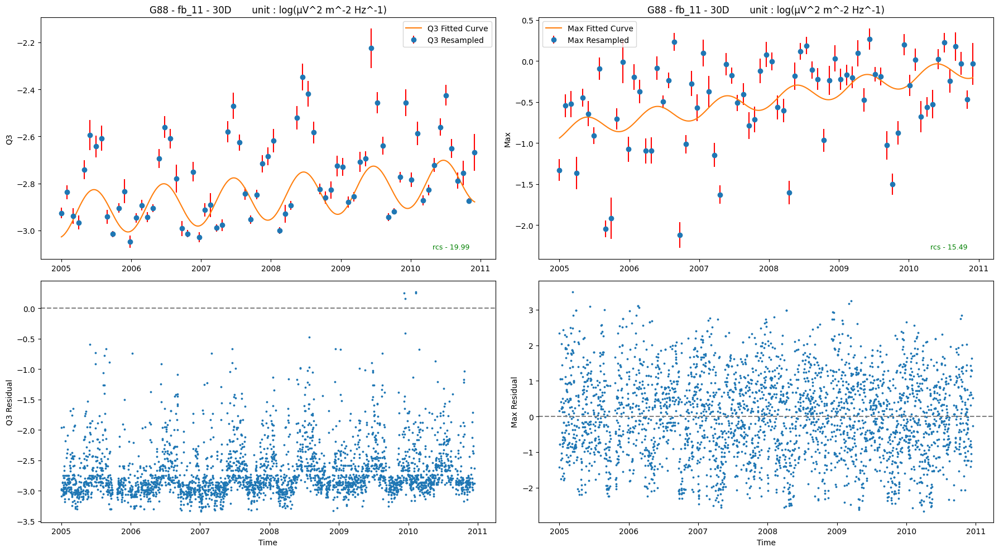

G89
fb_1


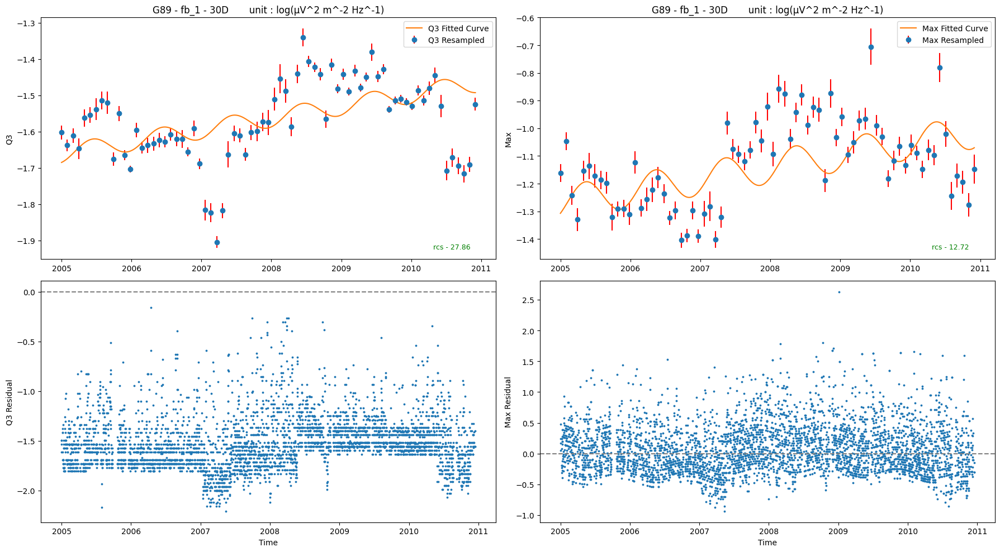

fb_4


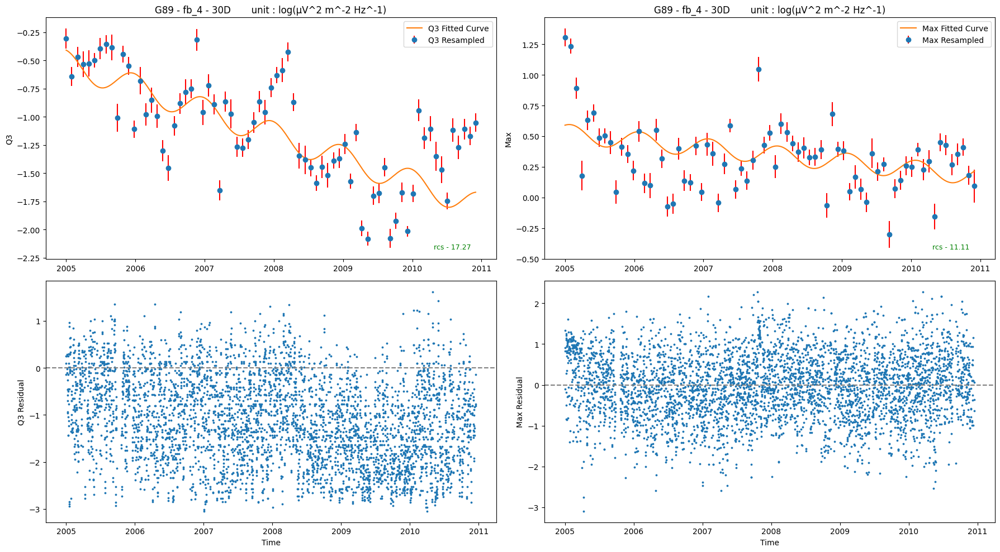

fb_11


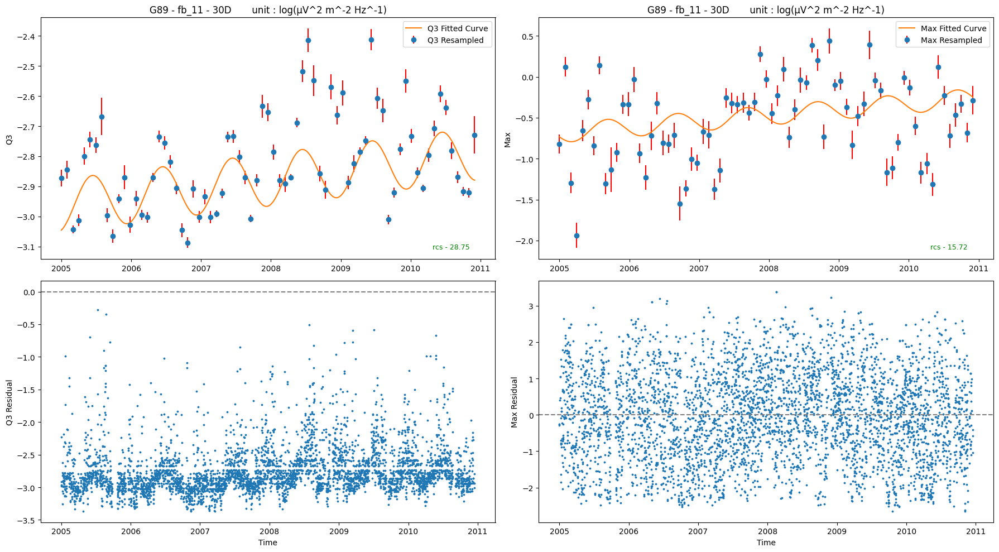

In [6]:
for specific_key in ['G123','G124','G125','G105','G106','G107','G87','G88','G89' ]:
    print(specific_key)
    for target in ['fb_1','fb_4','fb_11']:
        print(target)
        fit_and_plot_data(specific_key, 100, target, '30D', 365.25, np.pi)

Plotting just the Q3 data

In [16]:


all_data = {}

def model_func(t, a, b, c, d, e):
    return a + t*b + c * np.sin((2*np.pi* t)/d + e)

def calculate_filtered_stats(data, column):
    mean_value = data[column].mean()
    conf_interval = stats.norm.interval(0.90, loc=mean_value, scale=np.std(data[column]))
    filtered_data = data[(data[column] >= conf_interval[0]) & (data[column] <= conf_interval[1])]
    
    if filtered_data.empty:
        filtered_data = data
    
    mean_filtered = filtered_data[column].mean()
    std_filtered = np.std(filtered_data[column]) / np.sqrt(len(filtered_data[column]))
    
    return mean_filtered, std_filtered

def fit_and_plot_data(specific_key, min_samples, target, window_size, d, e):
    all_band_values = {}
    total_samples = sum(len(grid_data) for grid_data in data[specific_key])
    
    if total_samples <= min_samples:
        return  # Exit if total samples are insufficient

    for grid_data in data[specific_key]:
        for band_key, band_data in grid_data.items():
            if band_key == target: 
                if band_key in all_band_values:
                    all_band_values[band_key].append(band_data)
                else:
                    all_band_values[band_key] = [band_data]


    for band_key, band_values in all_band_values.items():
        # Extract datetime and Q values and convert to DataFrame
        datetime_values = [pd.to_datetime(entry['datetime']) for entry in band_values]
        q3_values = [entry['Q3'] for entry in band_values]

        df = pd.DataFrame({
            'datetime': datetime_values,
            'Q3': q3_values
        })

        df.set_index('datetime', inplace=True)
        timestamp_data1 = pd.to_datetime(datetime_values)
        timestamp_values1 = timestamp_data1.to_numpy().astype('datetime64[s]').astype('int')
        t1 = (timestamp_values1 - timestamp_values1[0]) / (24 * 3600)  # convert to days
        # print(t1)
        # Resample the DataFrame to specified window size
        resampled_groups = df.resample(window_size)
        window_data = {window: group for window, group in resampled_groups}
       
        results = []

        for key, dat in window_data.items():
            dat = dat.dropna(subset=['Q3'])

            if not dat.empty and len(dat) >= 2:
                mean_std_results = {}
                for column in ['Q3']:
                    mean_filtered, std_filtered = calculate_filtered_stats(dat, column)
                    mean_std_results[f'mean_{column}'] = mean_filtered
                    mean_std_results[f'std_{column}'] = std_filtered

                mean_std_results['window'] = key
                results.append(mean_std_results)
          
        if len(results) < 25:  # Adjust the threshold as needed
            print(f"Ignoring specific_key: {specific_key}, not enough data points after resampling")
            continue

        resampled_df = pd.DataFrame(results)
        
        # resampled_df.to_csv('test.csv')
        resampled_df.dropna(inplace=True)

        # Convert datetime index to numeric for fitting
        t_data = resampled_df['window']
        timestamp_data = pd.to_datetime(t_data)
        timestamp_values = timestamp_data.to_numpy().astype('datetime64[s]').astype('int')
        t = (timestamp_values - timestamp_values[0]) / (24 * 3600)  # convert to days

        q_resampled = {}
        q_std = {}
        for column in ['Q3']:
            q_resampled[column] = resampled_df[f'mean_{column}'].values
            q_std[column] = resampled_df[f'std_{column}'].values

        initial_guess = {}
        for column in ['Q3']:
            initial_guess[column] = [
                np.mean(q_resampled[column]),
                (q_resampled[column][-1] - q_resampled[column][0]) / len(q_resampled[column]),
                (q_resampled[column].max() - q_resampled[column].min()) / 2,
                d,
                e
            ]

        # SETC
        lower_bounds = [-np.inf, -np.inf, 0, 365.25 ,-np.inf]
        upper_bounds = [np.inf, np.inf, 2.5, 365.2500001, np.inf]

        popt = {}
        pcov = {}
        residuals = {}
        residual_errors = {}
        for column in ['Q3']:
            popt[column], pcov[column] = curve_fit(
                model_func,
                t,
                q_resampled[column],
                p0=initial_guess[column],
                sigma=q_std[column],
                maxfev=650000,
                bounds=(lower_bounds, upper_bounds)
            )

            fig, axes = plt.subplots(2,1, figsize=(18, 8))
   

            a, b, c, d, e = popt[column]
            y_fit = model_func(t, a, b, c, d, e)
            y_fit1 = model_func(t1, a, b, c, d, e)
            t_fine = np.linspace(t.min(), t.max(), len(datetime_values))
            y_fit_fine = model_func(t_fine, a, b, c, d, e)
    

            chi_square = np.sum(((q_resampled[column] - y_fit) / q_std[column]) ** 2)
            dof = len(q_resampled[column]) - len(popt[column])
            rcs_resampled = chi_square / dof


            fine_timestamps = pd.to_datetime(t_fine * 24 * 3600 + timestamp_values[0], unit='s')
            # Plot data with error bars and fitted curve
            axes[0].errorbar(t_data, q_resampled[column], yerr=q_std[column], fmt='o',ecolor='r', label=f'{column} Resampled')
            axes[0].plot(fine_timestamps, y_fit_fine, label=f'{column} Fitted Curve')
            axes[0].text(0.9, 0.05,f' rcs - {rcs_resampled:.2f}', horizontalalignment='center',
         verticalalignment='center', transform = axes[0].transAxes, 
         fontsize=9,color ='green')

            
            # axes[idx,0].set_xlabel('Time')
            axes[0].set_ylabel(column)
            axes[0].legend()
            axes[0].set_title(f' {specific_key} - {band_key} - {window_size}       unit : log(μV^2 m^-2 Hz^-1)')
            # axes[0].set_xlabel('Time')

            # Plot residuals
            residuals = q3_values - y_fit1
            # y_fit1_std = np.std(y_fit1)/np.sqrt(len(y_fit1))
            q3_std = np.std(q3_values)/np.sqrt(len(q3_values))
            residual_errors = np.std(residuals)
            
        
            
            axes[ 1].scatter(datetime_values, residuals, s=3 )
            axes[1].axhline(y=0, color='gray', linestyle='--')
            # axes[1].set_title(f'Residuals')
            axes[1].set_xlabel('Time')
            axes[1].set_ylabel(f'{column} Residual')
        # plt.text(0.05, 0.009, 'log(μV^2 m^-2 Hz^-1)', va='center', rotation='vertical', fontsize=10)
        # fig.tight_layout()
        # folder_path = f"C:\\PROJECT-DEMETER\\Anomaly\\GRID-Method\\SetC-Curvefit\\{target}"
        

        # os.makedirs(folder_path, exist_ok=True)
        # plt.savefig(os.path.join(folder_path, f'fit_{specific_key}_{target}-set2.png'))
        x_bins = np.arange(np.min(t1), np.max(t1), 60)
        y_bins = np.arange(np.min(residuals), np.max(residuals), 0.1)

        # Create a 2D histogram
        plt.figure(figsize=(8, 5))  # Set figure size
        hist = plt.hist2d(t1, residuals, bins=(x_bins, y_bins), cmap='viridis')
        plt.colorbar(hist[3], label='Counts')

        plt.axhline(y=0, color='yellow', linestyle='--')
        plt.xlabel('Time', fontsize=14)
        plt.ylabel('Residuals', fontsize=14)
        # plt.title('2D Histogram of Residuals vs. Time', fontsize=16)

        # Enhance ticks' visibility
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        # Display the plot
        plt.tight_layout()  # Adjust layout to fit everything
        plt.show()
        for column in ['Q3']:
            a, b, c, d, e = popt[column]
            y_fit = model_func(t, a, b, c, d, e)

            chi_square = np.sum(((q_resampled[column] - y_fit) / q_std[column]) ** 2)
            dof = len(q_resampled[column]) - len(popt[column])
            reduced_chi_square = chi_square / dof

            print(f'The reduced chi-square for {column}: {reduced_chi_square}')
        
            # print(f'Optimized parameters for {column}: {popt[column]}')

# ['G123','G124','G125','G105','G106','G107','G87','G88','G89']


G123
fb_1


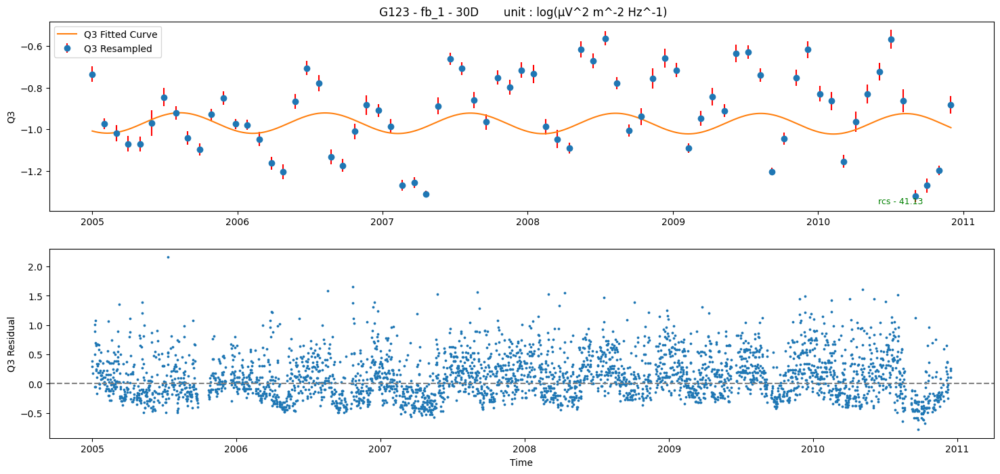

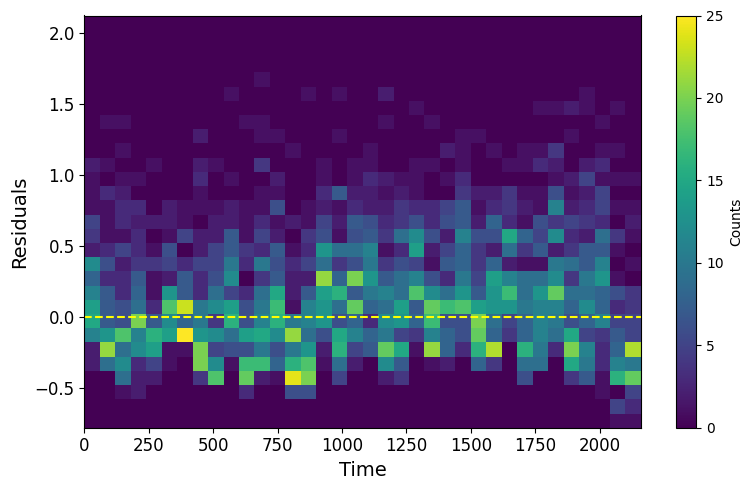

The reduced chi-square for Q3: 41.132009550191434
fb_4


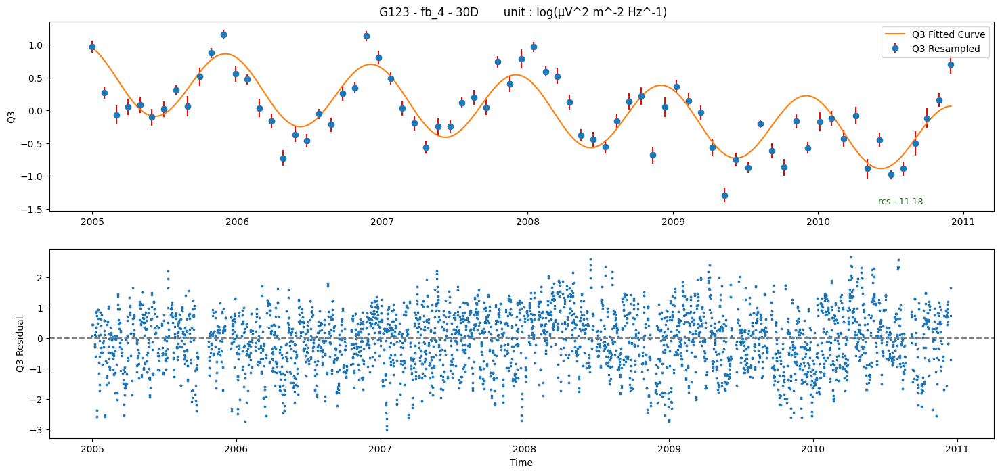

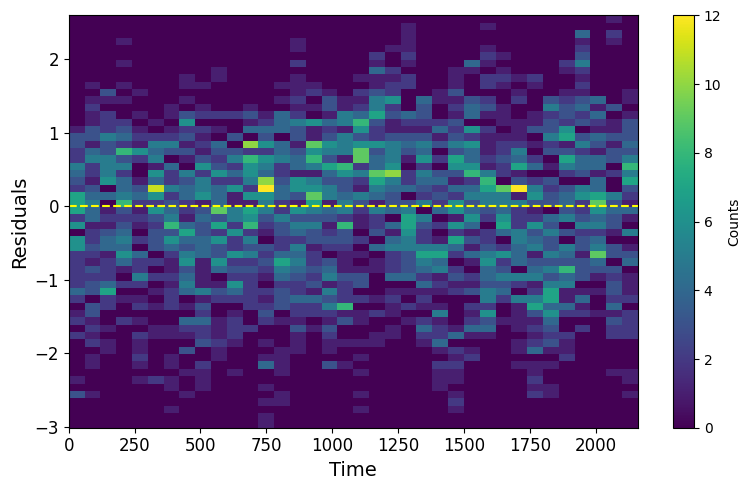

The reduced chi-square for Q3: 11.176525103298664
fb_11


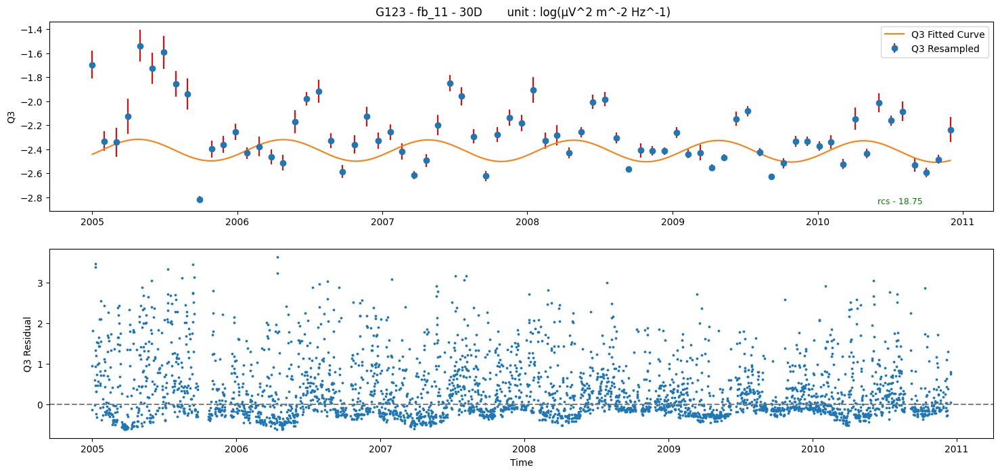

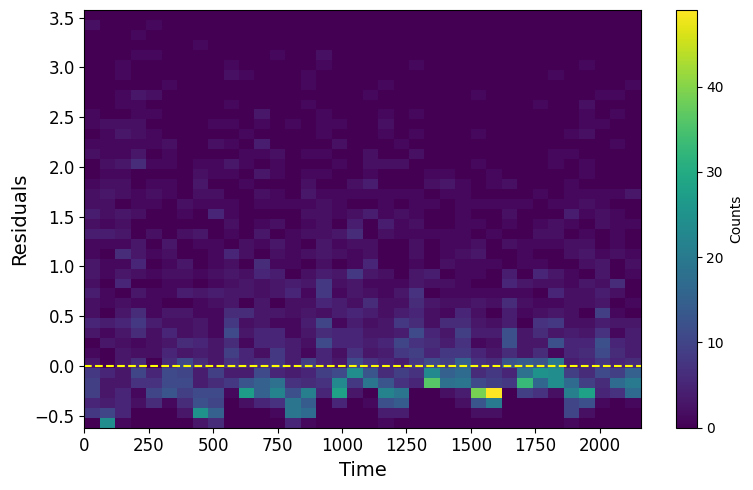

The reduced chi-square for Q3: 18.752266617724572
G124
fb_1


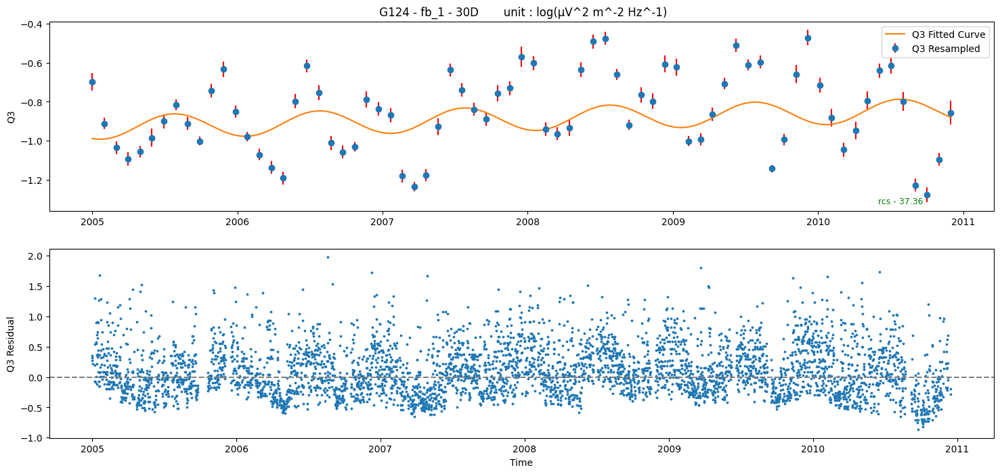

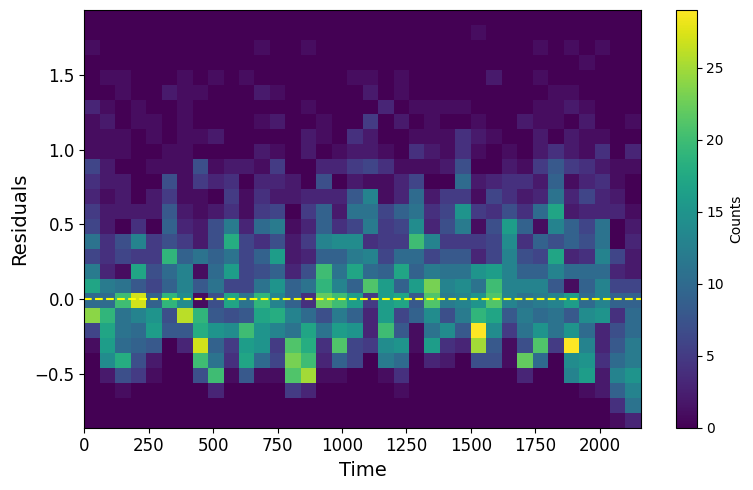

The reduced chi-square for Q3: 37.363957934402144
fb_4


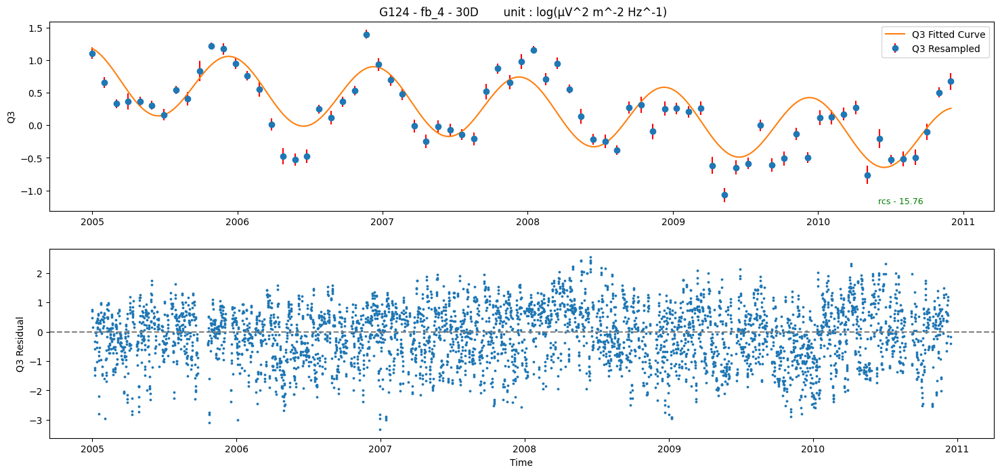

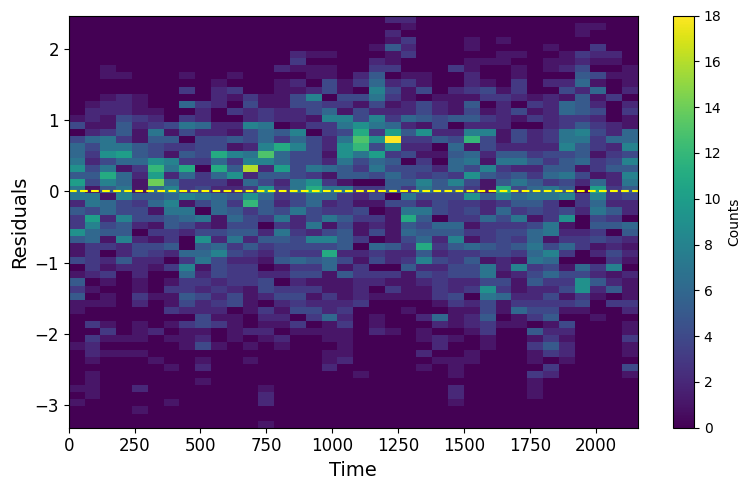

The reduced chi-square for Q3: 15.763145877204405
fb_11


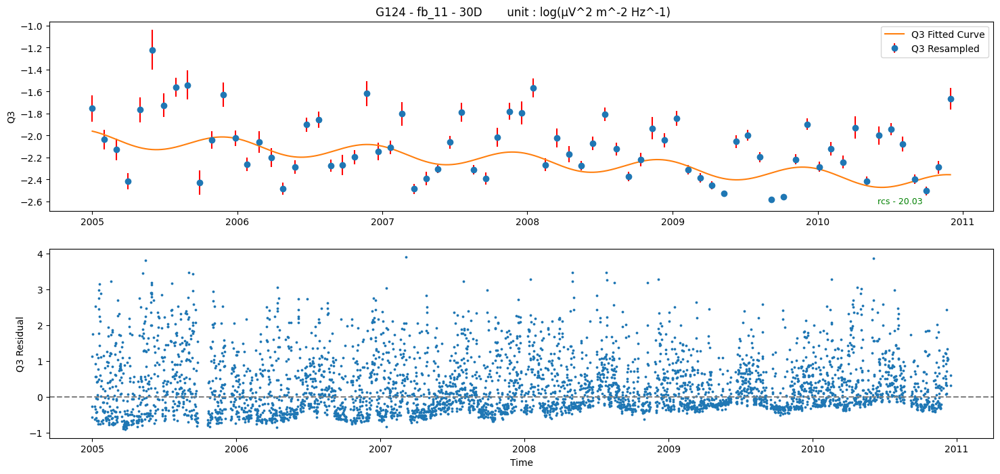

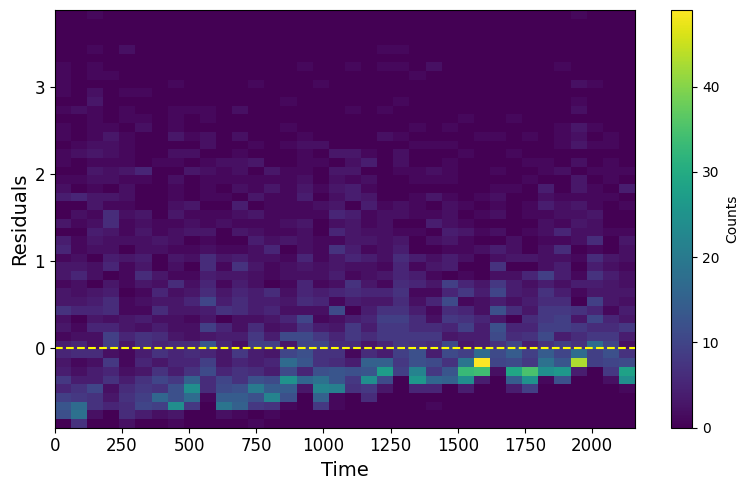

The reduced chi-square for Q3: 20.03077870897199
G125
fb_1


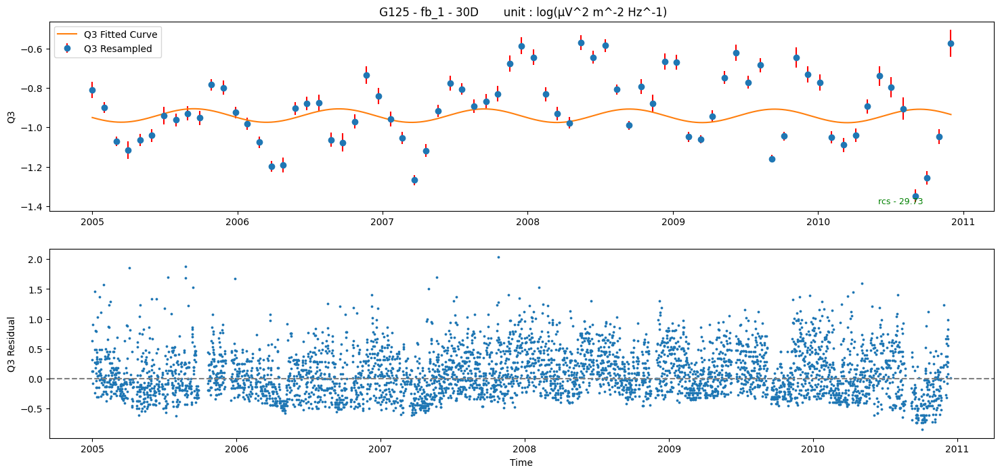

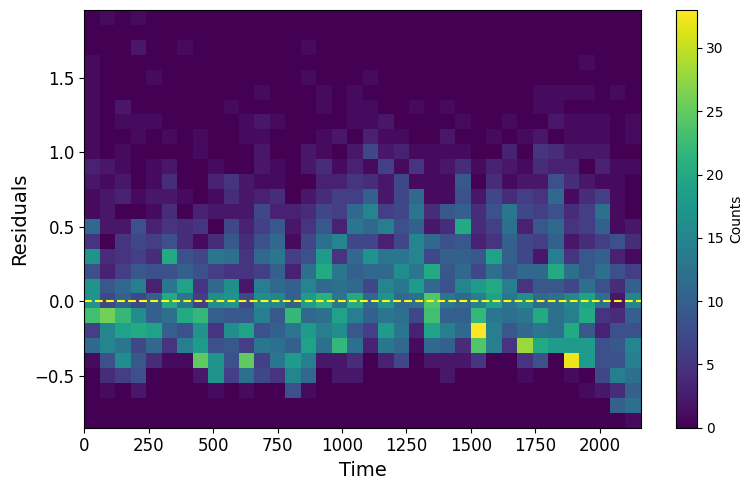

The reduced chi-square for Q3: 29.729693982058453
fb_4


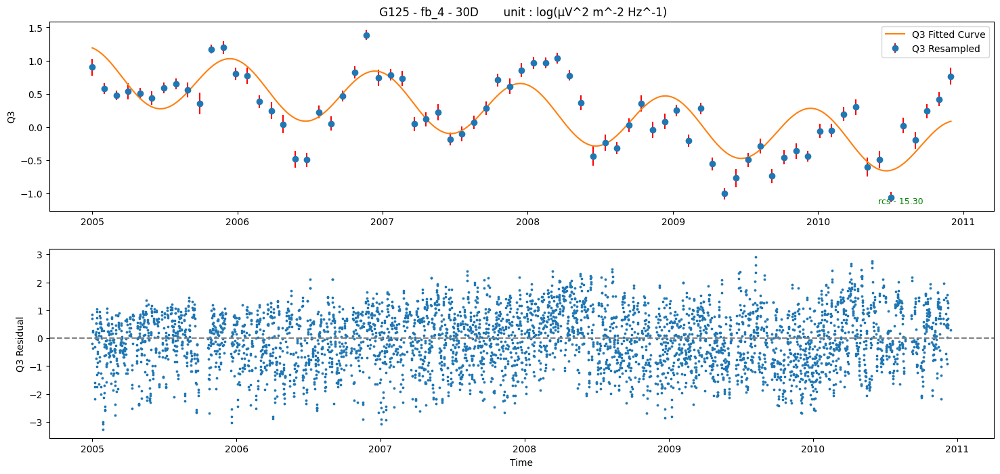

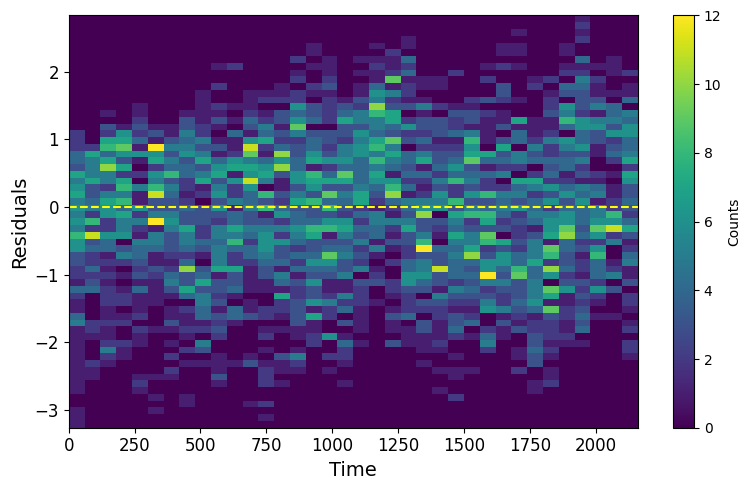

The reduced chi-square for Q3: 15.30006314896015
fb_11


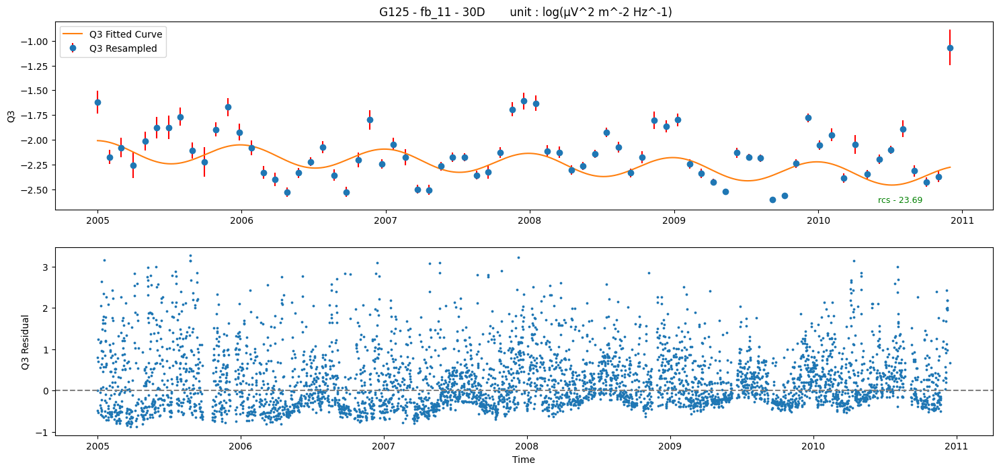

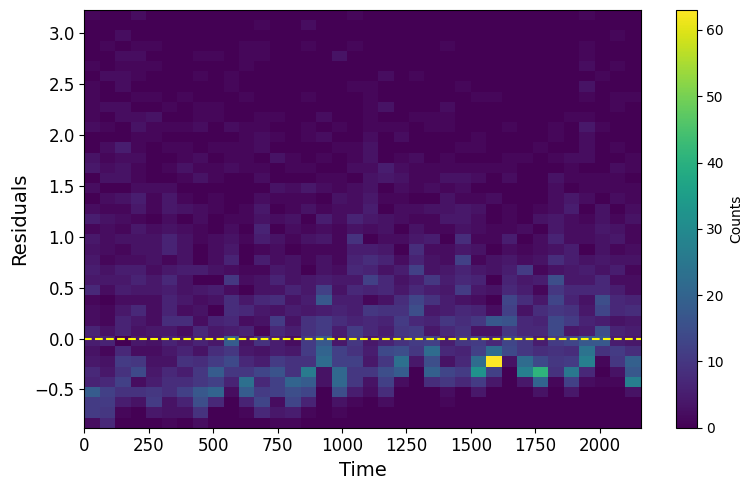

The reduced chi-square for Q3: 23.69376894124663
G105
fb_1


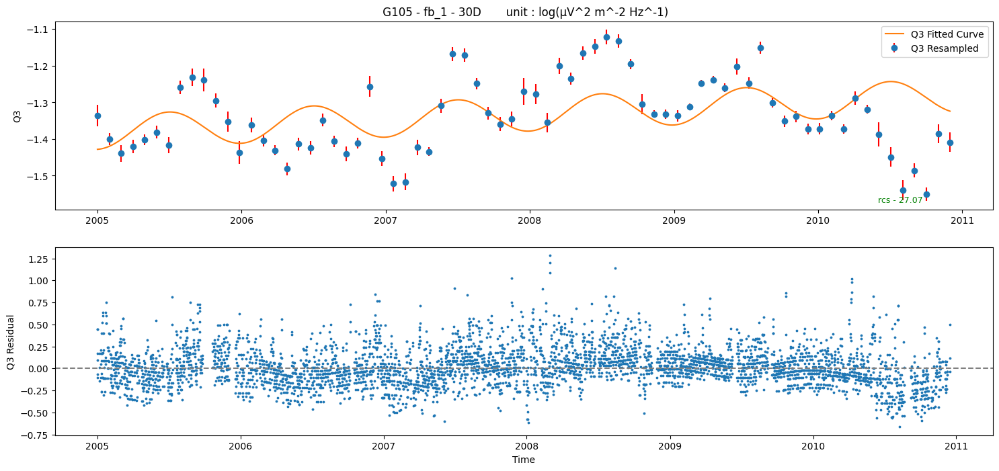

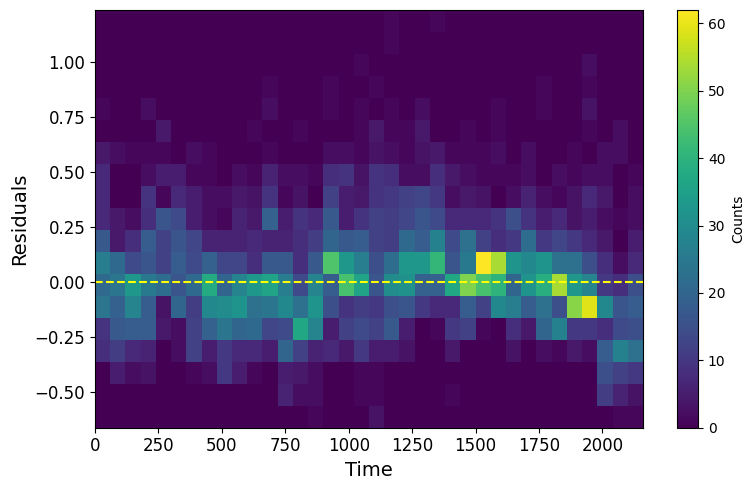

The reduced chi-square for Q3: 27.07423204826378
fb_4


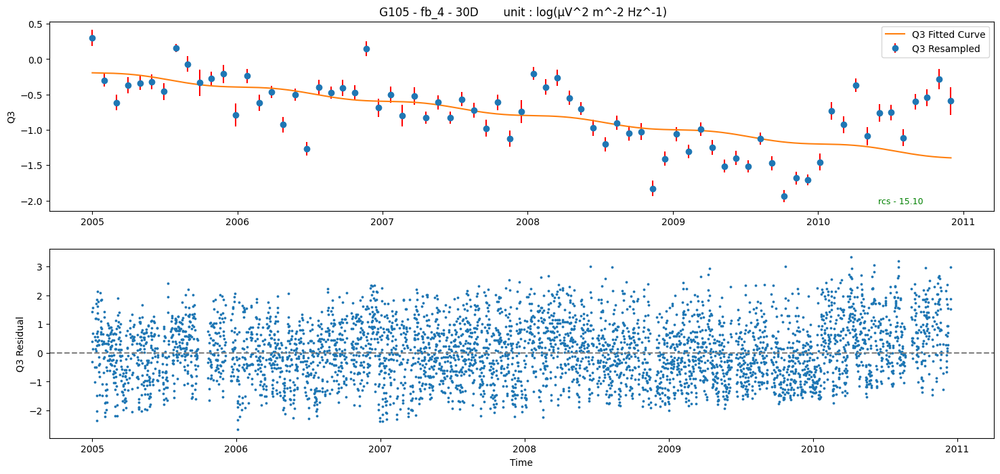

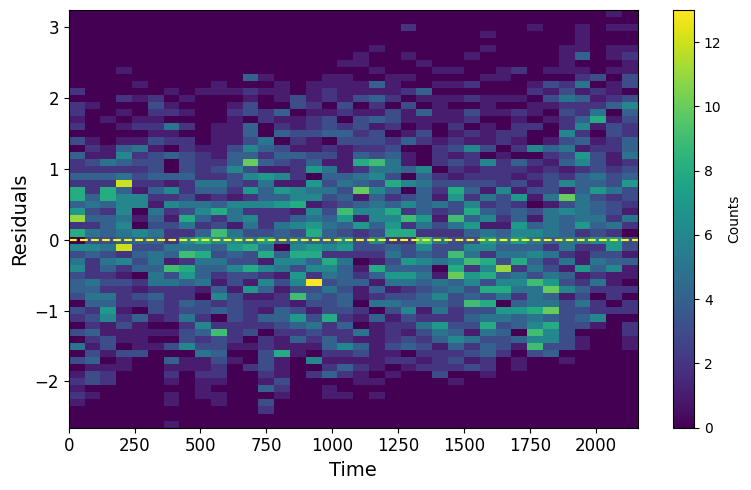

The reduced chi-square for Q3: 15.09574003835462
fb_11


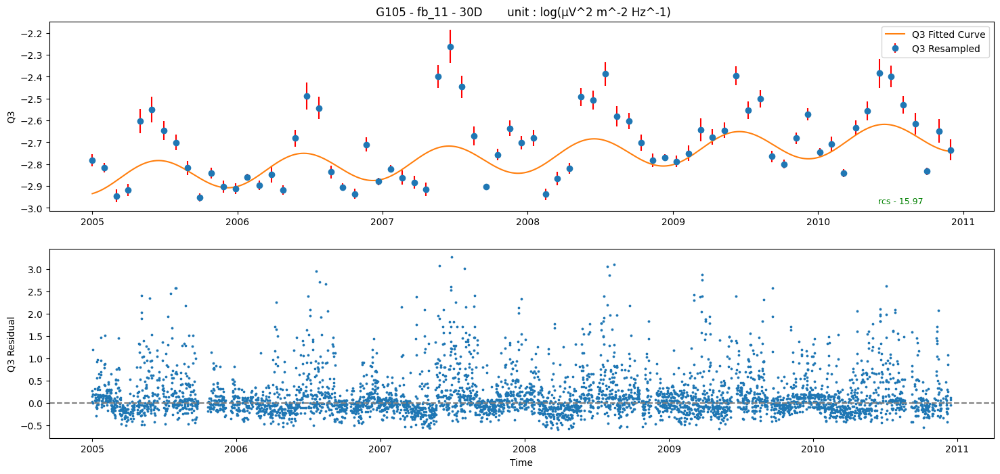

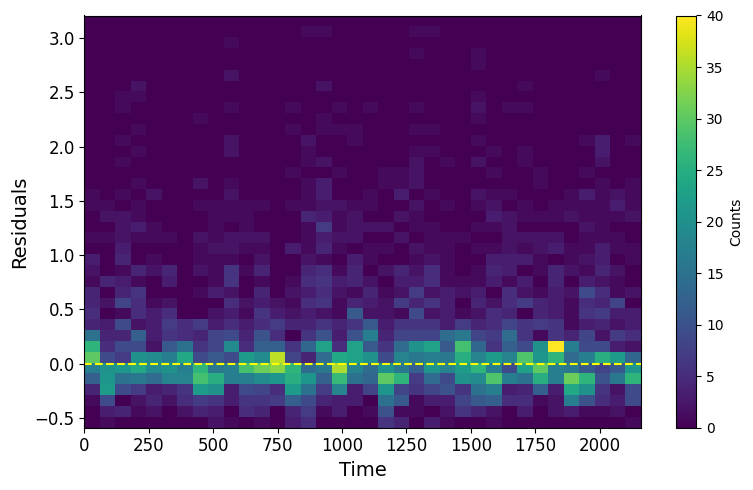

The reduced chi-square for Q3: 15.972195867418373
G106
fb_1


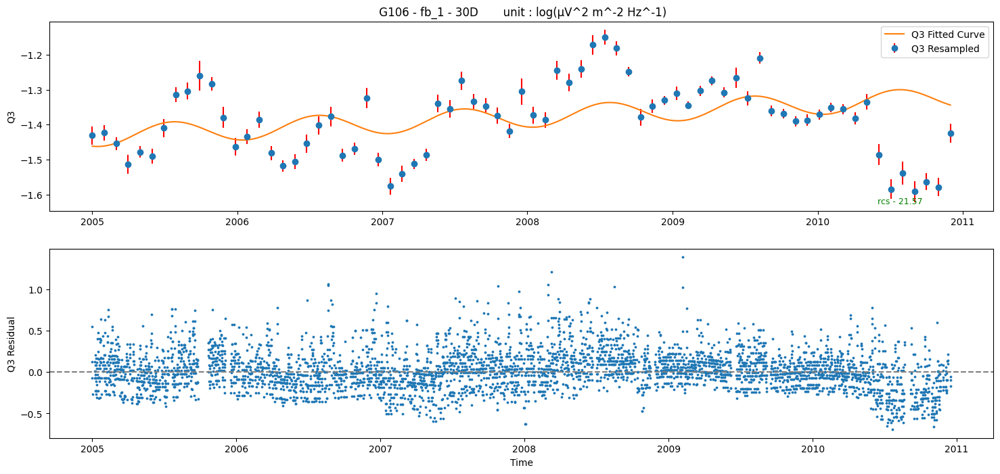

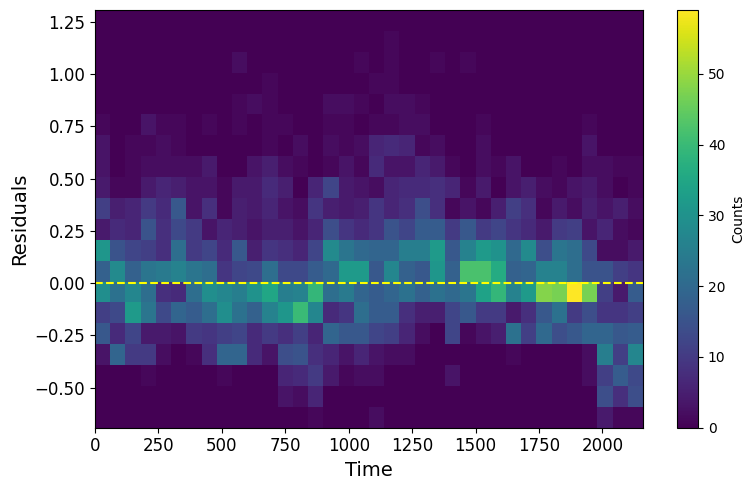

The reduced chi-square for Q3: 21.572404673104813
fb_4


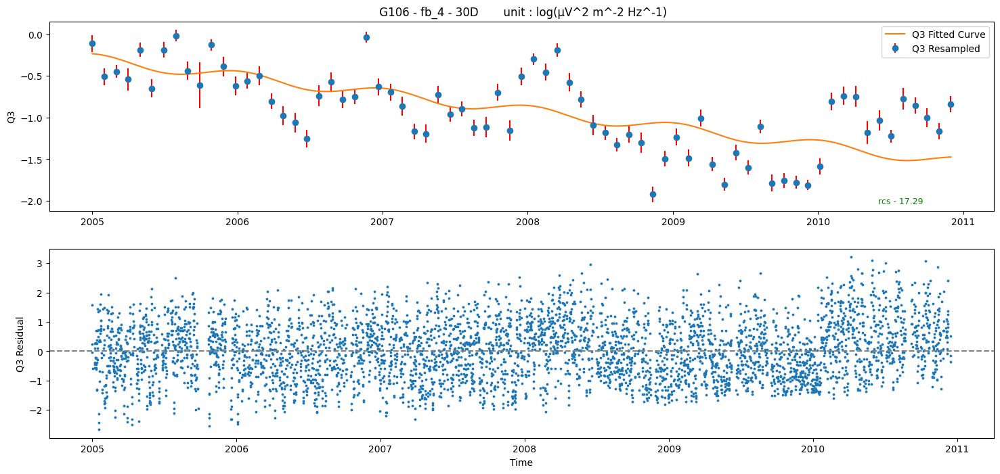

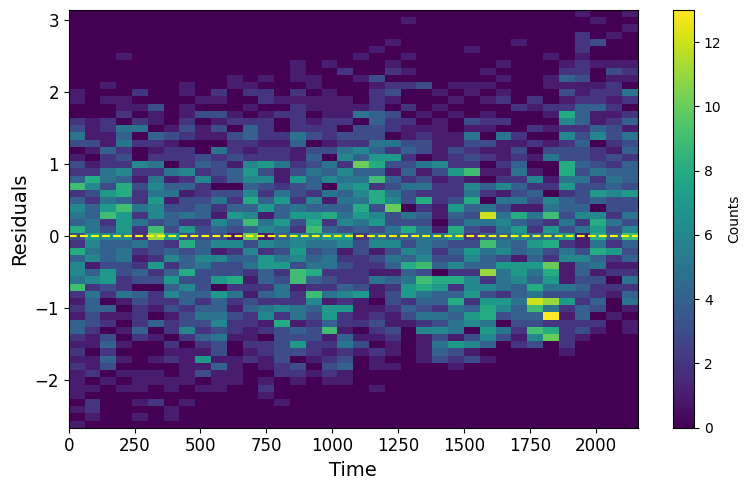

The reduced chi-square for Q3: 17.294886111275133
fb_11


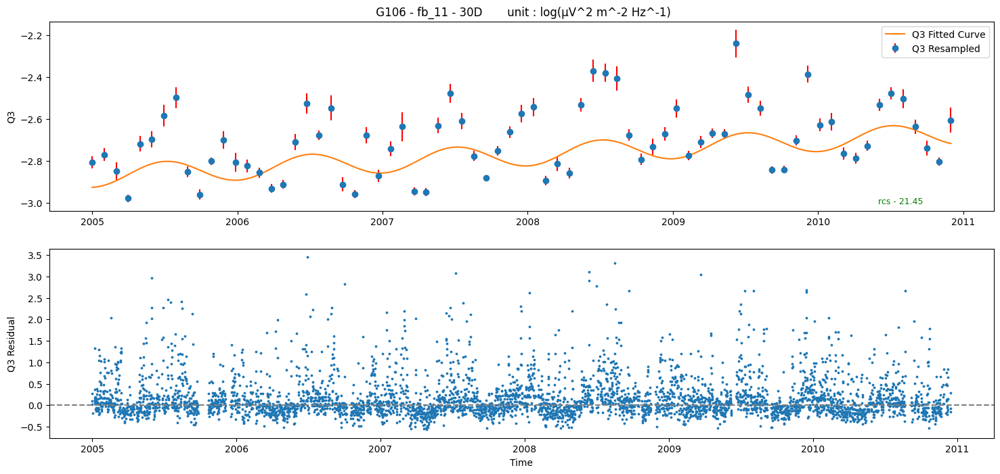

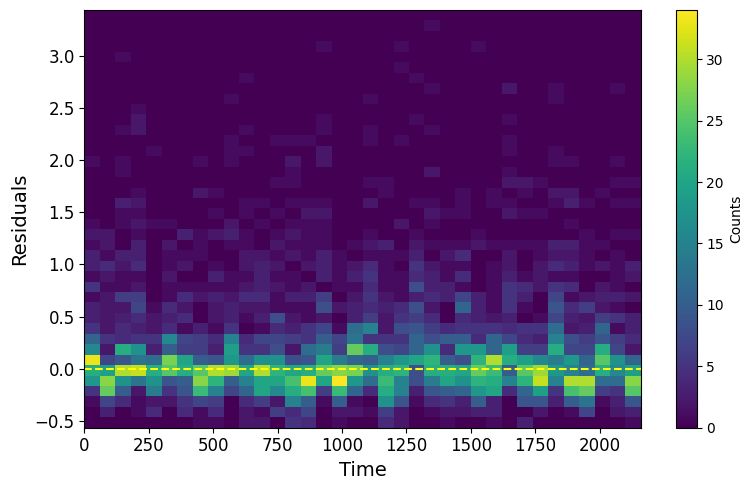

The reduced chi-square for Q3: 21.44788770172989
G107
fb_1


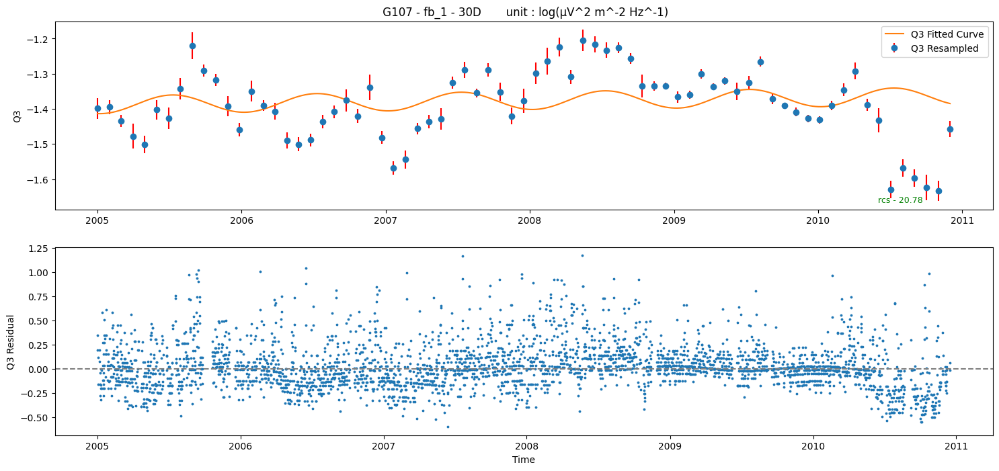

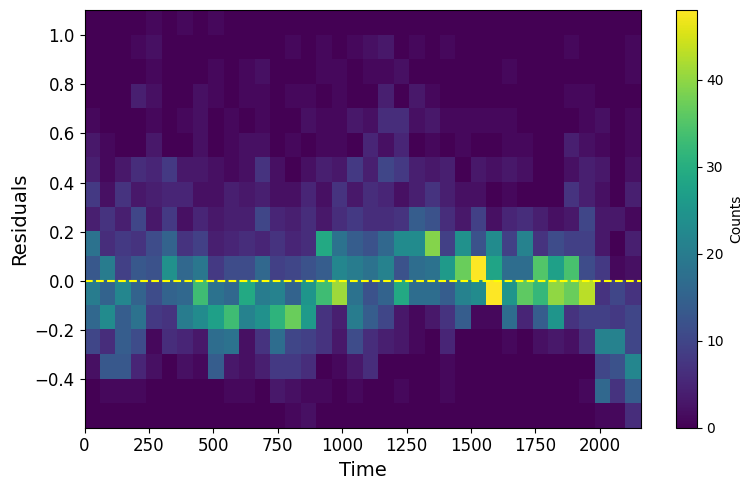

The reduced chi-square for Q3: 20.777881224341424
fb_4


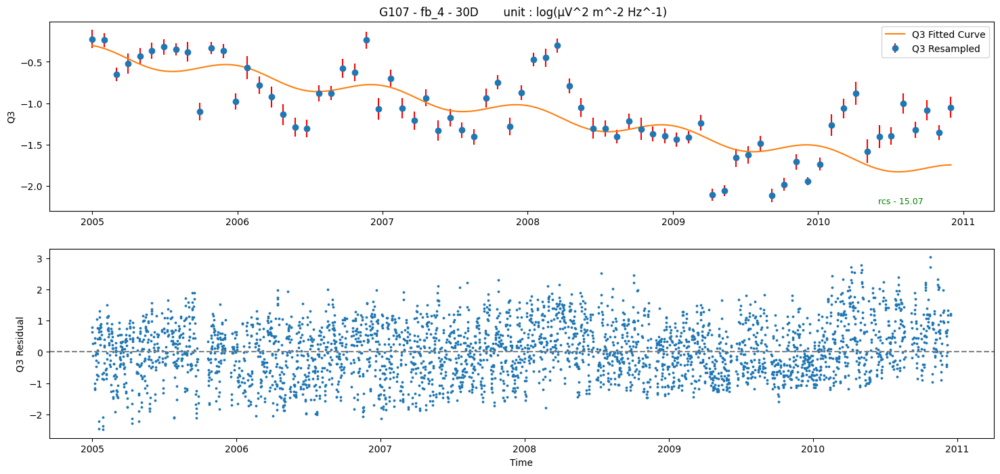

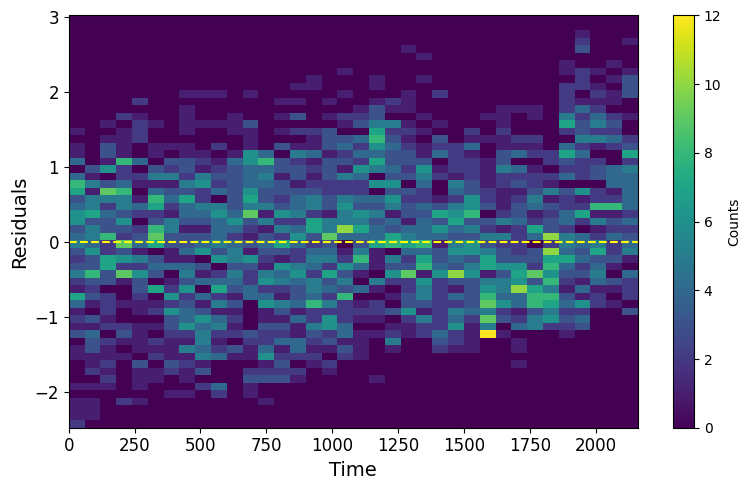

The reduced chi-square for Q3: 15.072161889500277
fb_11


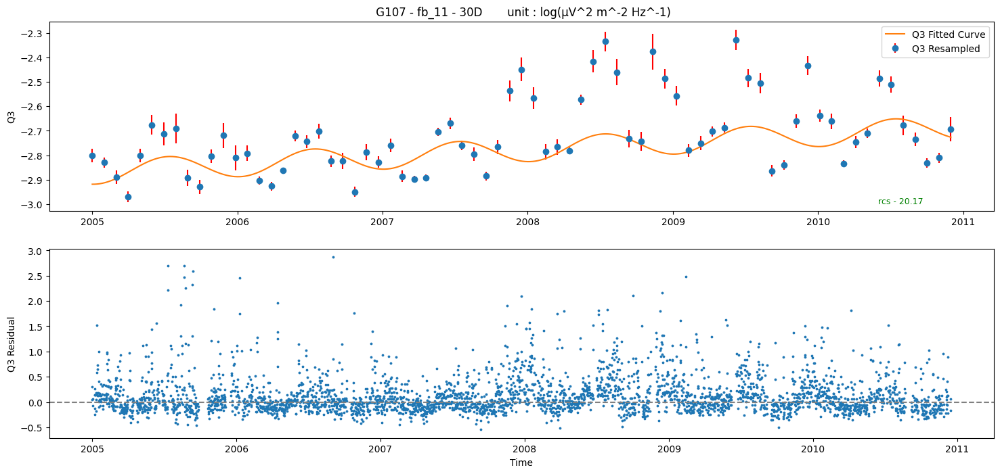

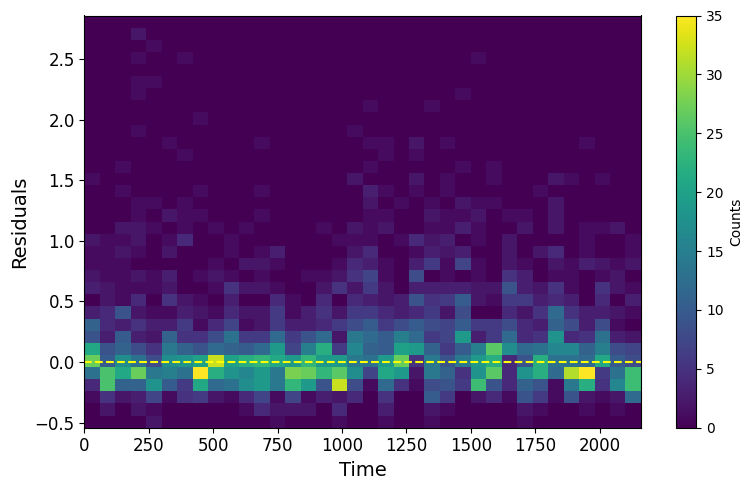

The reduced chi-square for Q3: 20.172519538855127
G87
fb_1


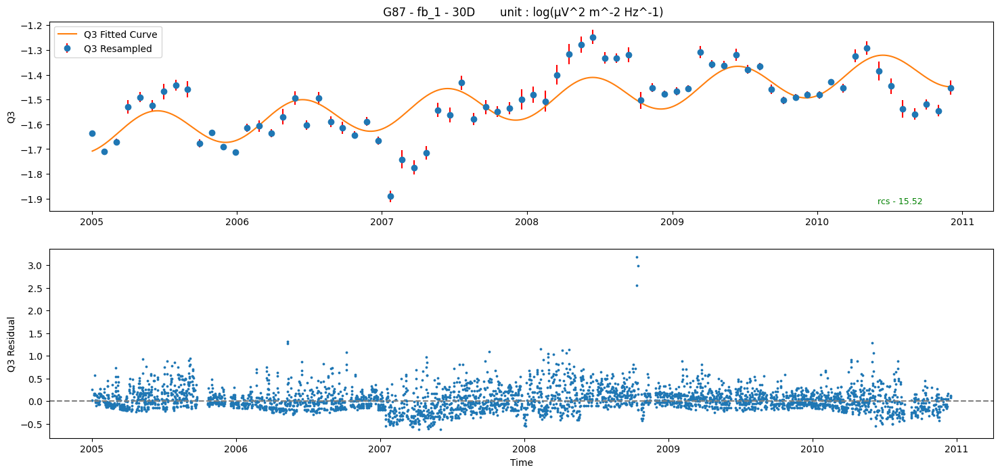

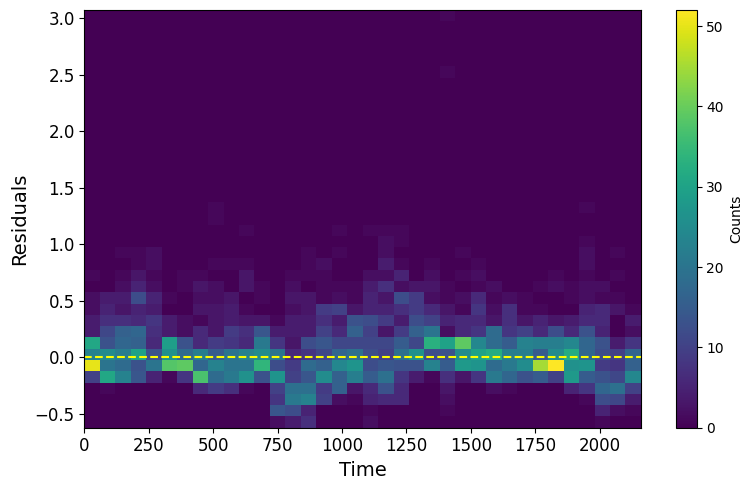

The reduced chi-square for Q3: 15.51833687905049
fb_4


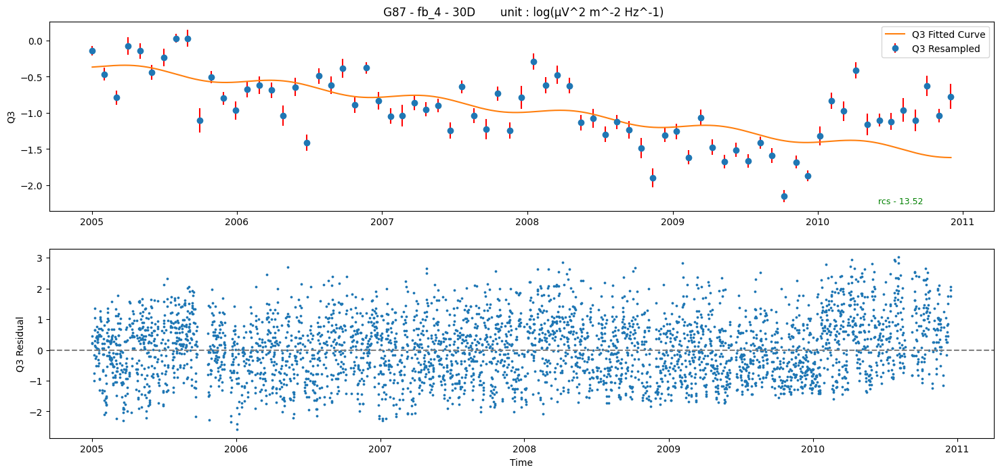

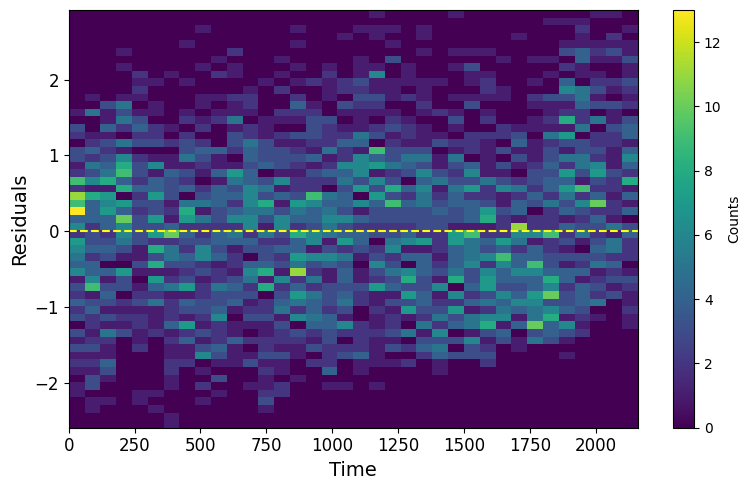

The reduced chi-square for Q3: 13.524850364030154
fb_11


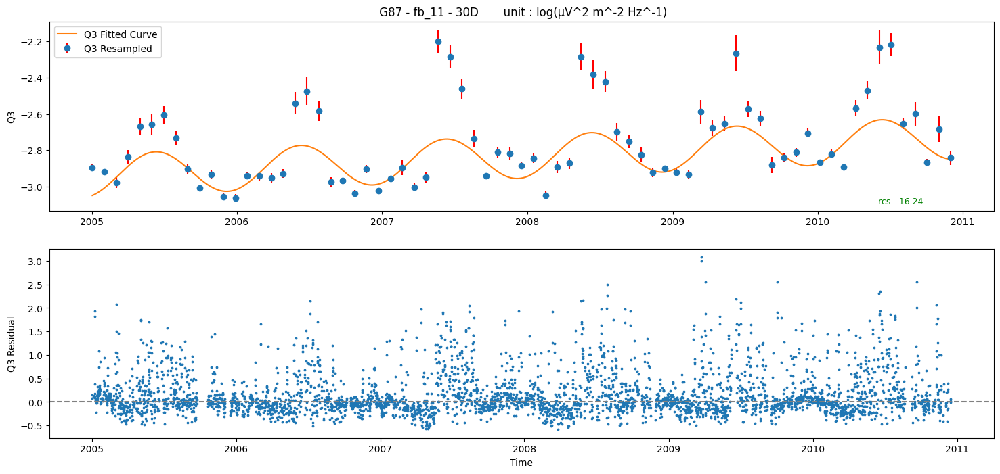

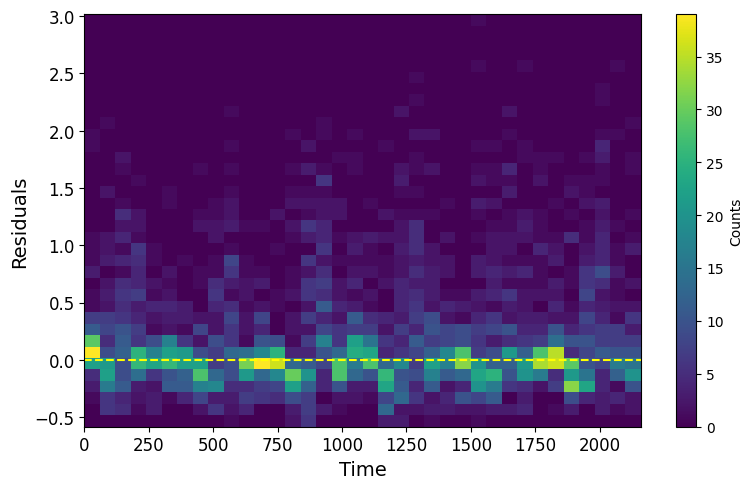

The reduced chi-square for Q3: 16.2378586748307
G88
fb_1


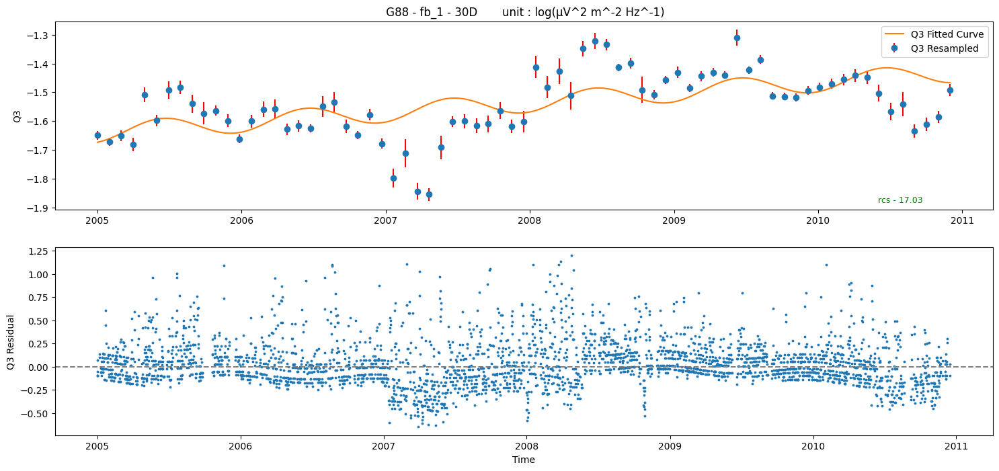

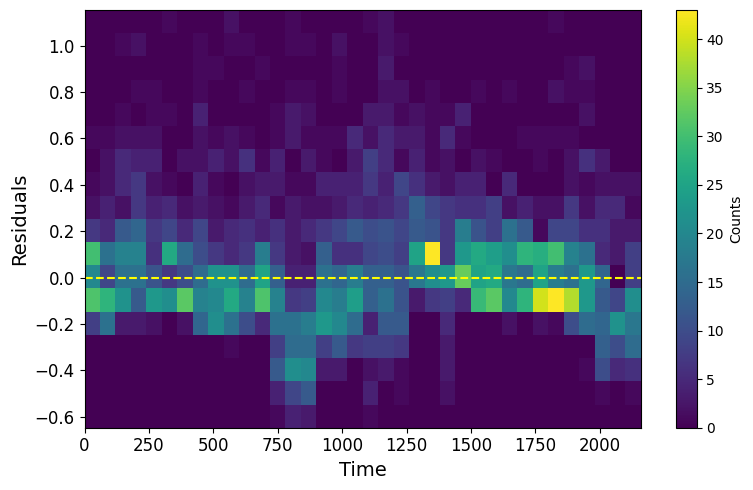

The reduced chi-square for Q3: 17.02799005177554
fb_4


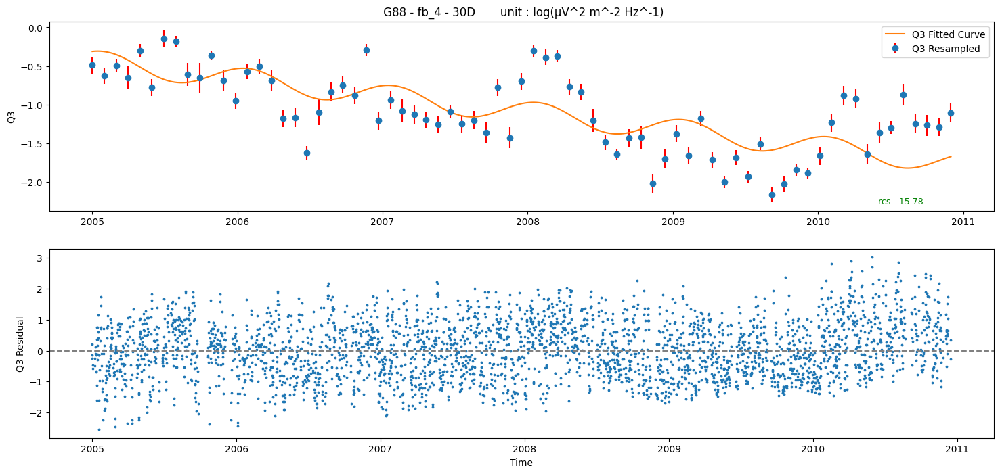

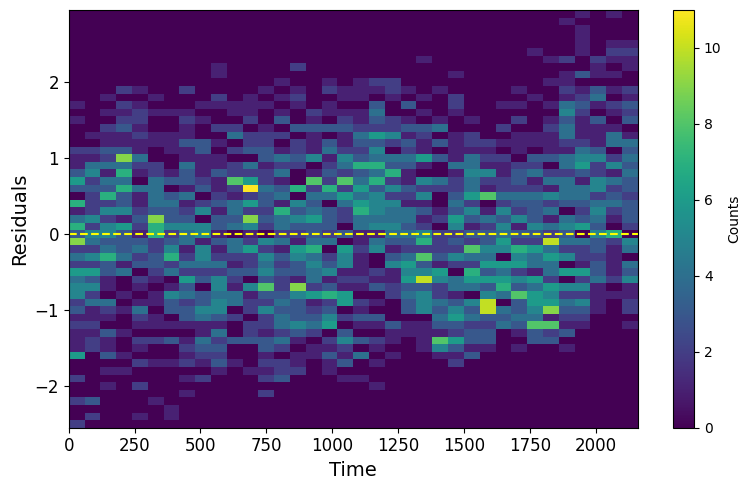

The reduced chi-square for Q3: 15.781706825980814
fb_11


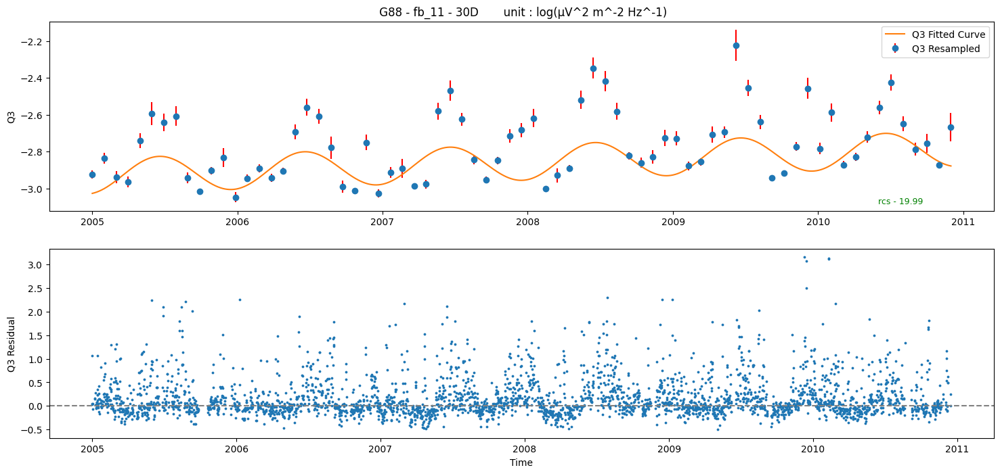

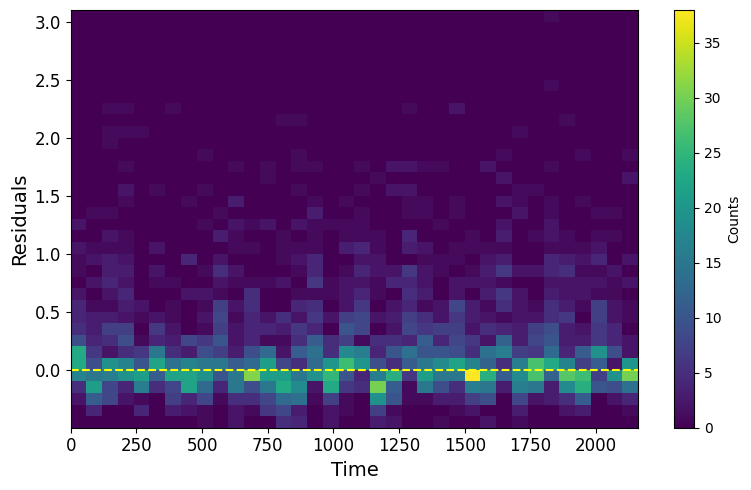

The reduced chi-square for Q3: 19.98876166651371
G89
fb_1


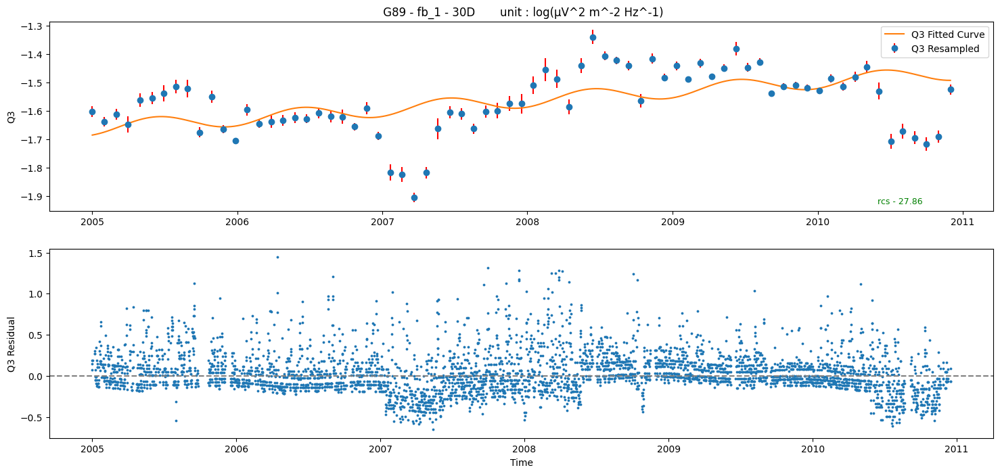

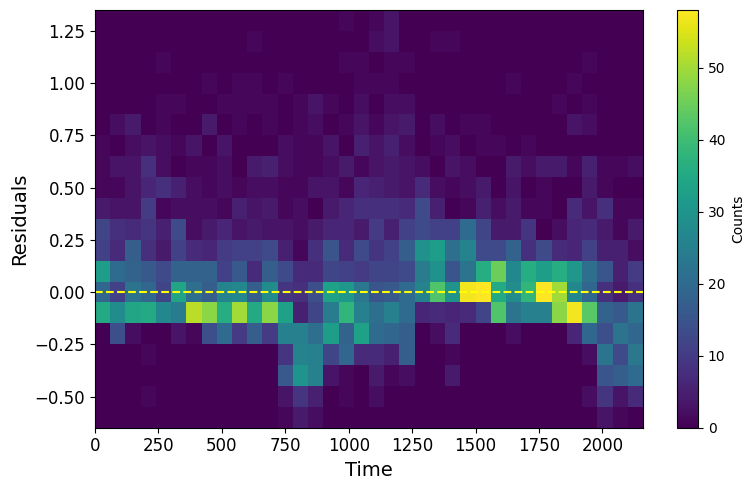

The reduced chi-square for Q3: 27.862504720707506
fb_4


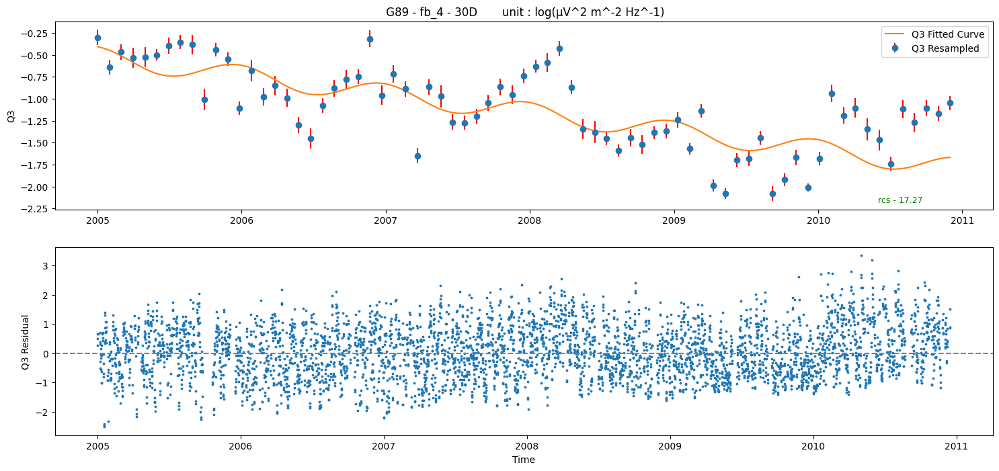

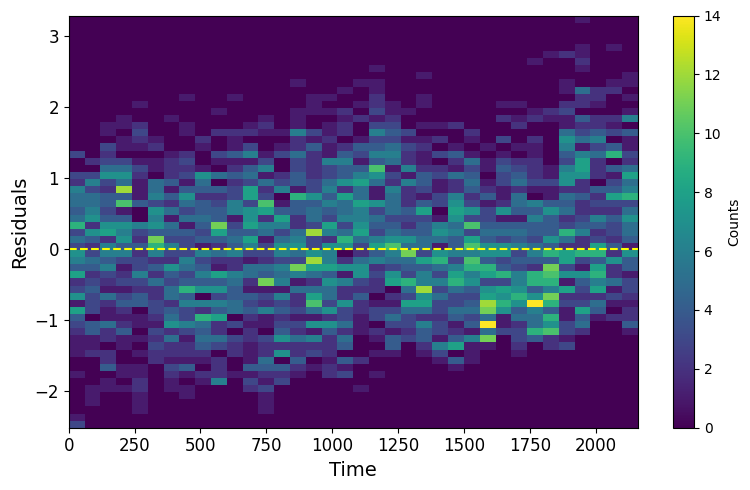

The reduced chi-square for Q3: 17.269467290881636
fb_11


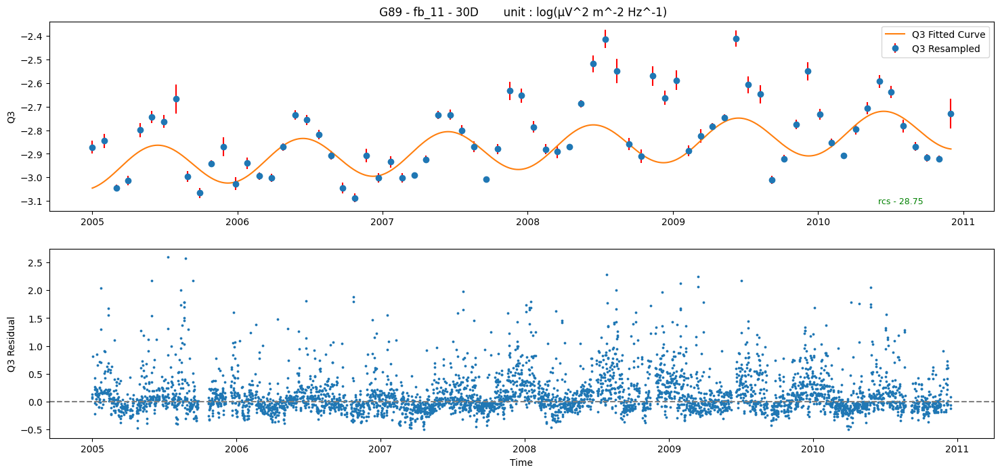

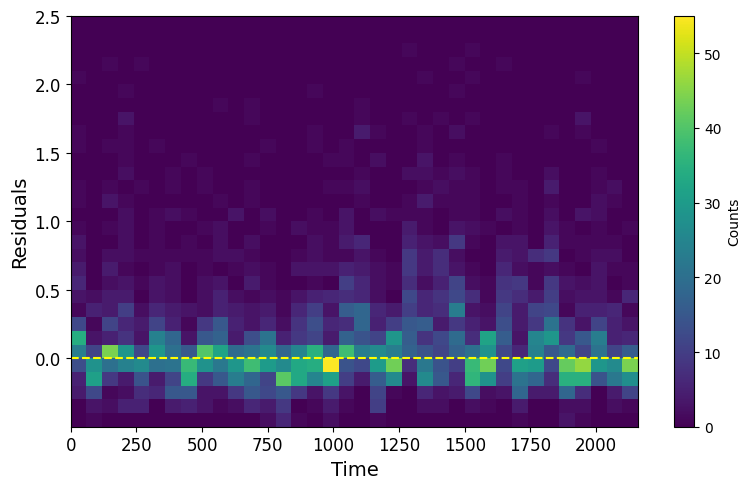

The reduced chi-square for Q3: 28.750999209855514


In [17]:

for specific_key in ['G123','G124','G125','G105','G106','G107','G87','G88','G89' ]:
    print(specific_key)
    for target in ['fb_1','fb_4','fb_11']:
        print(target)
        fit_and_plot_data(specific_key, 100, target, '30D', 365.25, np.pi)
# for specific_key in ['G107','G88']:
#     print(specific_key)
#     for target in ['fb_1','fb_4','fb_11']:
#         print(target)
#         fit_and_plot_data(specific_key, 100, target, '30D', 365.25, np.pi)



